# Import libraries

In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


Missing colon in file '/Users/jamesli/.matplotlib/matplotlibrc', line 1 ('TkAgg')


In [2]:
import celloracle as co
co.__version__

'0.6.2'

In [3]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

## 0.1. Check installation

Celloracle uses some R libraries in network analysis. 
Please make sure that all dependent R libraries are installed on your computer.
You can test the installation with the following command.

In [4]:
co.network_analysis.test_R_libraries_installation()

R path: /anaconda3/envs/celloracle_env/bin/R
checking R library installation: igraph -> OK
checking R library installation: linkcomm -> OK
checking R library installation: rnetcarto -> OK


## 0.2. Make a folder to save graph

In [5]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

# 1. Load data
## 1.1. Load processed gene expression data (anndata)

In [6]:
# Load data. !!Replace the data path below when you use another data.
adata = sc.read_h5ad("data/E12.h5ad")

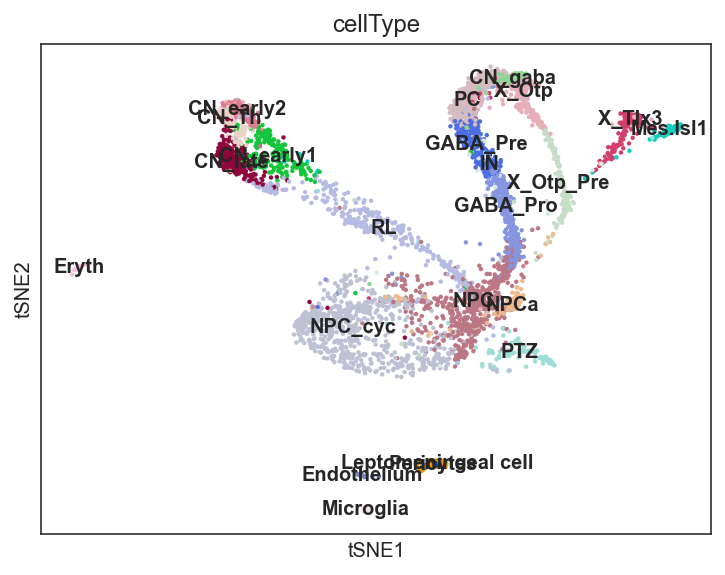

In [7]:
# check data
sc.pl.tsne(adata, color="cellType", legend_loc='on data')

## 1.2. Load TF data. 
For the GRN inference, CellOracle needs TF information, which contains lists of the regulatory candidate genes. 

In [8]:
# TF data from scATAC-seq of the mouse cerebellum from E!2-E14
TFinfo_df = pd.read_parquet("data/TFinfo_dataframe.parquet")

# Check data
TFinfo_df.head()

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100004434_100004934,Kitl,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100015536_100016036,Cep290,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_100015536_100016036,Kitl,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,chr10_100015536_100016036,Tmtc3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,chr10_100016814_100017314,Kitl,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 2. Initiate Oracle object

We instantiate an Oracle object, then input the gene expression data (anndata) and a TFinfo into the Oracle object. The Oracle object stores all of necessary information and does the calculations with its internal functions.

In [9]:
# Instantiate Oracle object
oracle = co.Oracle()

## 2.1. load gene expression data into oracle object.

The clustering data should be to be stored in the attribute of "obs" in the anndata.
Dimensional reduction data suppose to be stored in the attribute of "obsm" in the anndata.
You can check these data by the following command.

For the celloracle analysis, the anndata shoud include (1) gene expression count, (2) clustering information, (3) trajectory (dimensional reduction embeddings) data. 

In [10]:
# show data name in anndata
print("metadata columns :", list(adata.obs.columns))
print("dimensional reduction: ", list(adata.obsm.keys()))

metadata columns : ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'seurat_clusters1', 'cellType', 'cellGroup', 'predicted.id.score', 'predicted.id']
dimensional reduction:  ['X_tsne', 'X_umap']


In [11]:
# In this notebook, we use raw mRNA count as an input of Oracle object.
# adata.X = adata.raw.X.copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="cellType",
                                   embedding_name="X_tsne")

In [12]:
oracle

## 2.2. Load TFinfo into oracle object

In [15]:
# Load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=TFinfo_df)


# 3. Knn imputation
CellOracle uses almost the same strategy as velocyto for visualizing cell transitions. This process requires KNN imputation in advance.


## 3.1. PCA

31


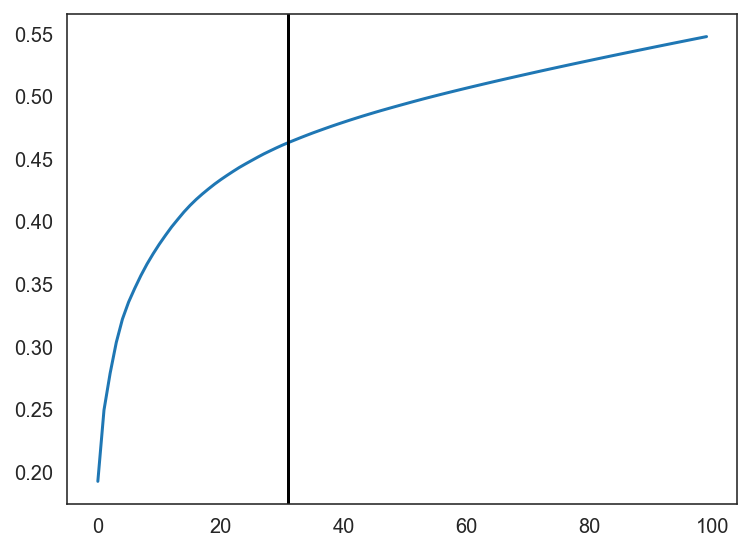

In [16]:
# Perform PCA
oracle.perform_PCA()
# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
print(n_comps)
n_comps = min(n_comps, 50)

## 3.2. KNN imputation

Estimate the optimal number of nearest neighbors for KNN imputation.

In [17]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :6114


In [18]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :152


In [19]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

# 4. Save and Load.


In [21]:
# Save CellOracle object.
oracle.to_hdf5("data/E12.celloracle.oracle")

In [17]:
# Load CellOracle object.
#oracle = co.load_hdf5("data/E12.celloracle.oracle")

# 5. GRN calculation
The next step is to construct a cluster-specific GRN for all clusters. GRNs are reconstructed with the "get_links" function, which returns GRNs as a Links object. The Links object stores inferred GRNs and the corresponding metadata. Network analysis will be performed with the Links object.

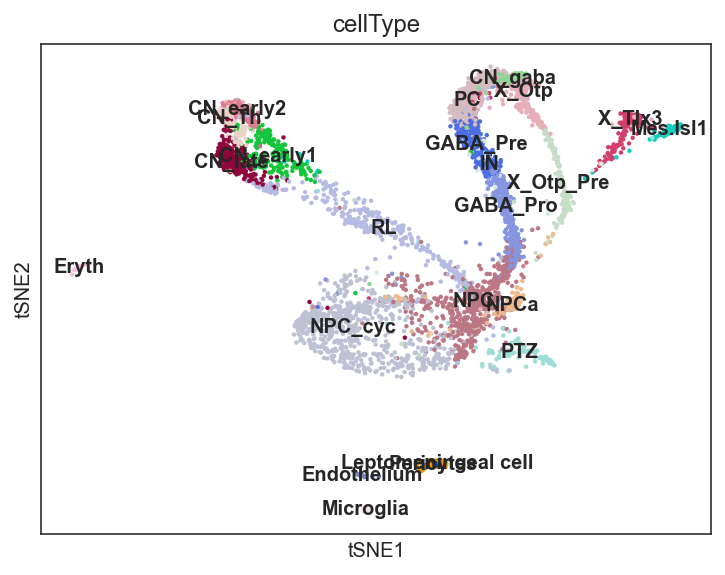

In [23]:
# check data
sc.pl.tsne(oracle.adata, color="cellType", legend_loc='on data')

## 5.1. Get GRNs

In [24]:
%%time
# Calculate GRN for each population in "cellType" clustering unit.
# This step may take a while.
links = oracle.get_links(cluster_name_for_GRN_unit="cellType", alpha=10,
                         verbose_level=10, test_mode=False)


inferring GRN for CN_Th...



inferring GRN for CN_early1...



inferring GRN for CN_early2...



inferring GRN for CN_gaba...



inferring GRN for CN_late...



inferring GRN for Endothelium...



inferring GRN for Eryth...



inferring GRN for GABA_Pre...



inferring GRN for GABA_Pro...



inferring GRN for IN...



inferring GRN for Leptomeningeal cell...



inferring GRN for Mes.Isl1...



inferring GRN for Microglia...



inferring GRN for NPC...



inferring GRN for NPC_cyc...



inferring GRN for NPCa...



inferring GRN for PC...



inferring GRN for PTZ...



inferring GRN for Pericytes...



inferring GRN for RL...



inferring GRN for X_Otp...



inferring GRN for X_Otp_Pre...



inferring GRN for X_Tlx3...




CPU times: user 1h 10min 7s, sys: 2min 27s, total: 1h 12min 35s
Wall time: 1h 18min 11s


## 5.2. (Optional) Export GRNs


In [28]:
links.links_dict.keys()

dict_keys(['CN_Th', 'CN_early1', 'CN_early2', 'CN_gaba', 'CN_late', 'Endothelium', 'Eryth', 'GABA_Pre', 'GABA_Pro', 'IN', 'Leptomeningeal cell', 'Mes.Isl1', 'Microglia', 'NPC', 'NPC_cyc', 'NPCa', 'PC', 'PTZ', 'Pericytes', 'RL', 'X_Otp', 'X_Otp_Pre', 'X_Tlx3'])

In [29]:
# get the GRN for "GABA_Pro"
cluster = "GABA_Pro"
links.links_dict[cluster]

,source,target,coef_mean,coef_abs,p,-logp
0,Jun,0610039K10Rik,0.0,0.0,NaN,-0.0
1,Egr1,0610039K10Rik,0.0,0.0,NaN,-0.0
2,Sox4,0610039K10Rik,0.0,0.0,NaN,-0.0
3,Sox10,0610039K10Rik,0.0,0.0,NaN,-0.0
4,Mafb,0610039K10Rik,0.0,0.0,NaN,-0.0
...,...,...,...,...,...,...
311925,Tal1,a,0.0,0.0,NaN,-0.0
311926,Lhx8,a,0.0,0.0,NaN,-0.0
311927,Tcf15,a,0.0,0.0,NaN,-0.0
311928,Foxf2,a,0.0,0.0,NaN,-0.0


In [30]:
links.links_dict[cluster].to_csv(f"tables/raw_GRN_for_{cluster}.csv")

# 6. Network preprocessing

## 6.1. Filter network edges 

CellOracle utilizes bagging ridge or Bayesian ridge regression to infer gene regulatory networks. These methods provide a network edge strength as a distribution rather than a point value. The distribution is used to measure the certainness of the connection.

The network edges are pruned as follows:

 (1) Remove uncertain network edges based on the p-value.
 
 (2) Remove weak network edge. In this tutorial, we pick up the top 2000 edges in terms of network strength.


The raw network data is stored as an attribute, "links_dict," while filtered network data is stored in "filtered_links." Thus the filtering function keeps raw network information rather than overwriting the data. You can come back to the filtering process to filter the data with different parameters if you want.

In [32]:
links.filter_links(p=0.001, weight="coef_abs", thread_number=2000)

## 6.2. Degree distribution 

In the first step, network degree distribution is calculated.
Network degree, which is the number of edges for each node, is one of the important metrics used to investigate the network structure (https://en.wikipedia.org/wiki/Degree_distribution).

Note that the degree distribution may change depending on the filtering threshold.

In [33]:
plt.rcParams["figure.figsize"] = [9, 4.5]

CN_Th


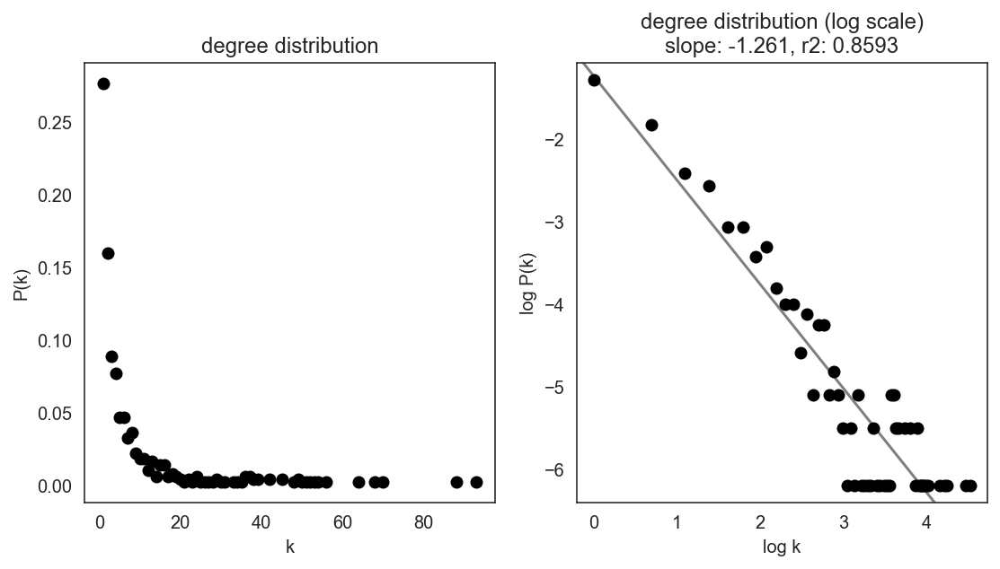

CN_early1


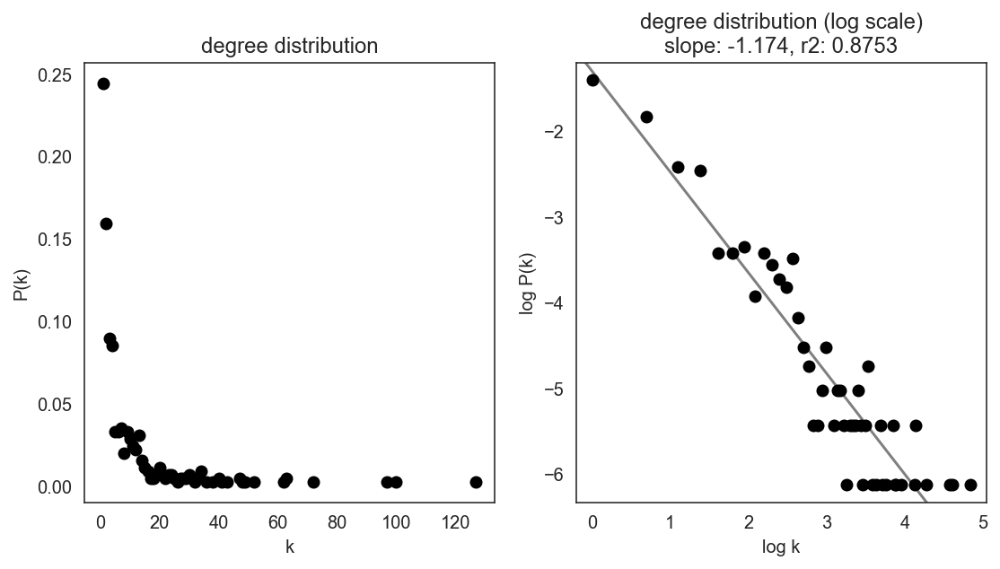

CN_early2


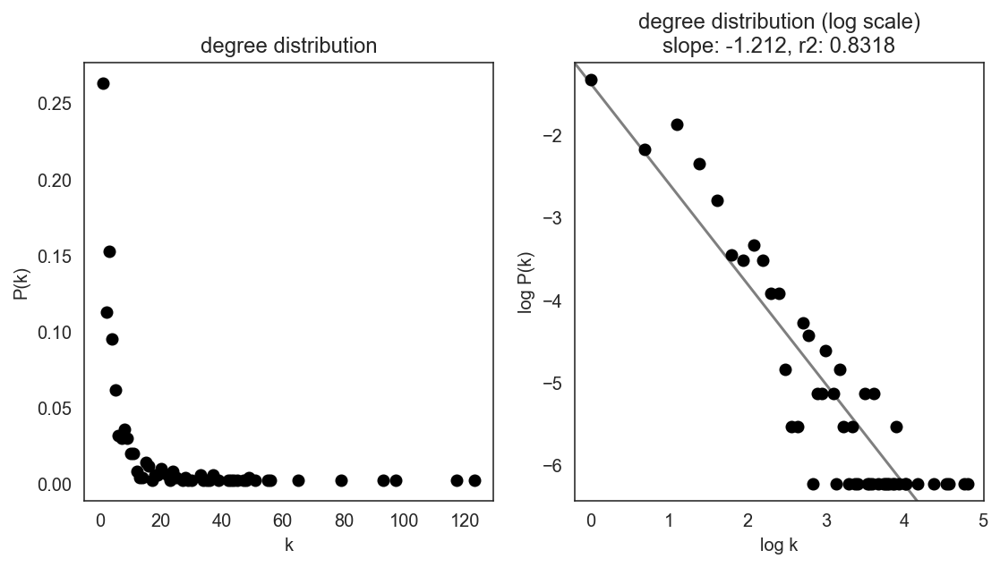

CN_gaba


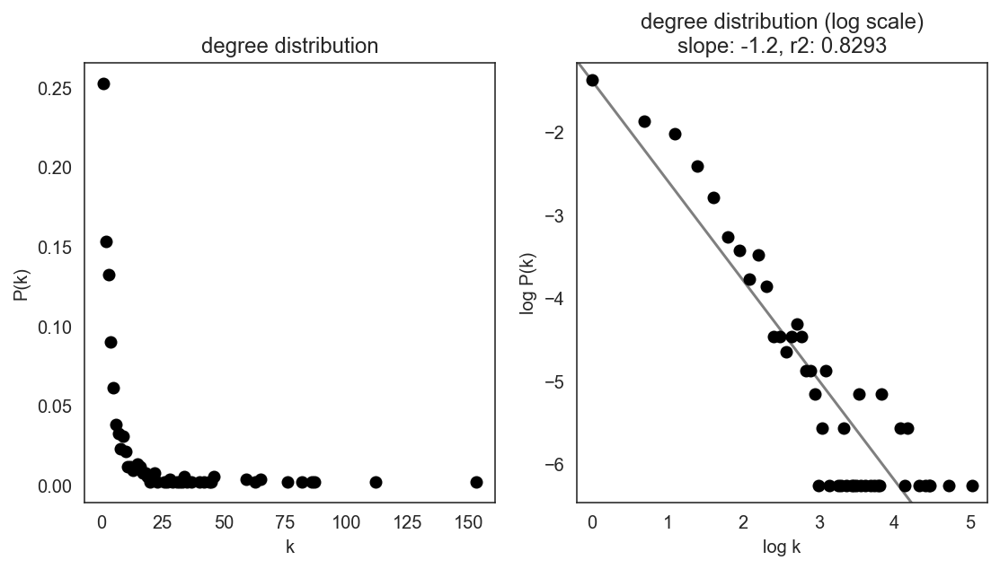

CN_late


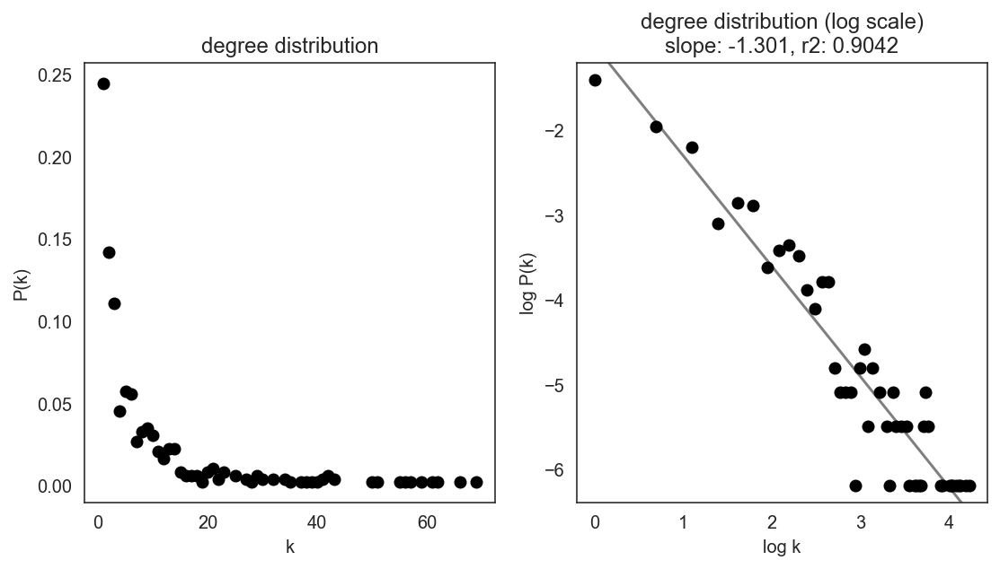

Endothelium


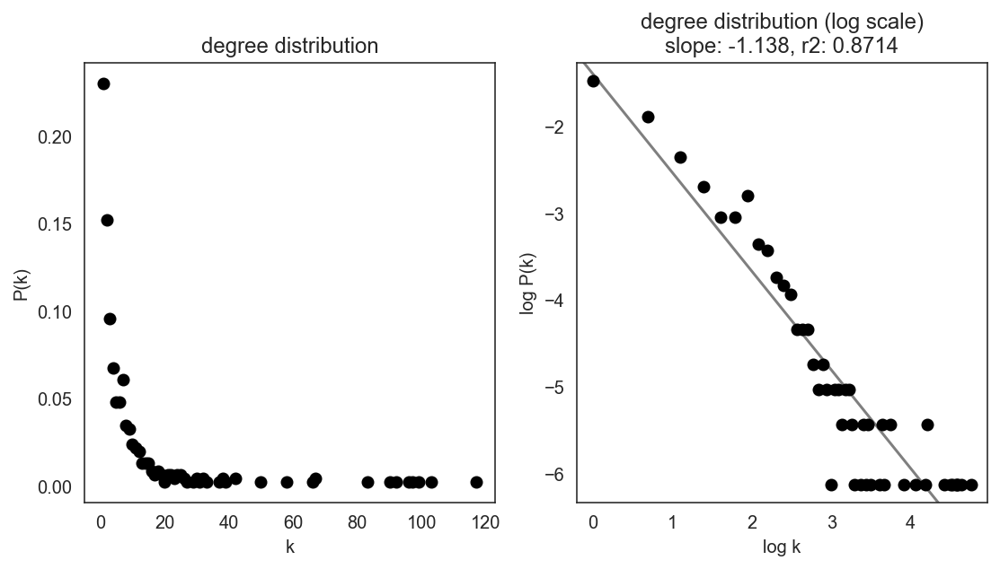

Eryth


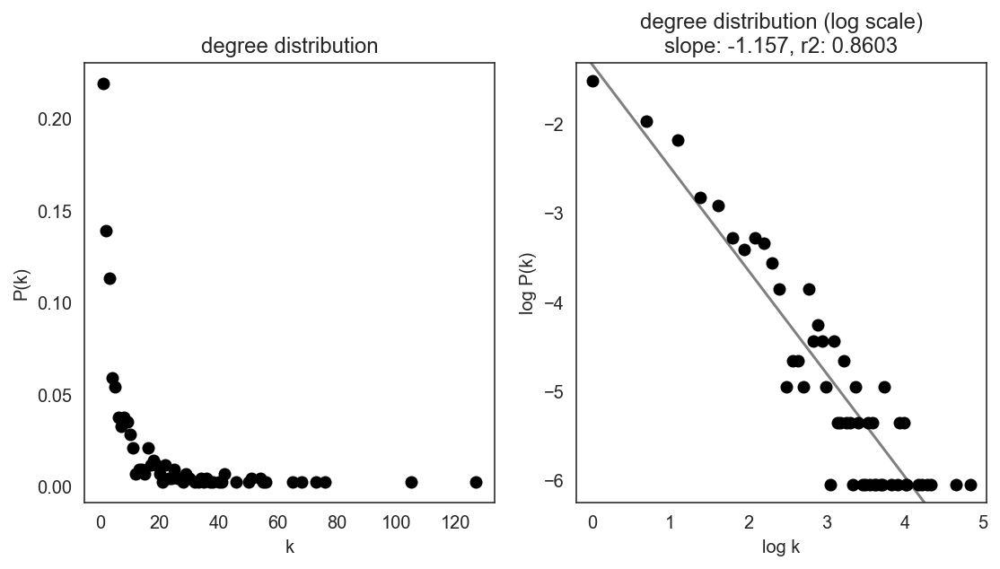

GABA_Pre


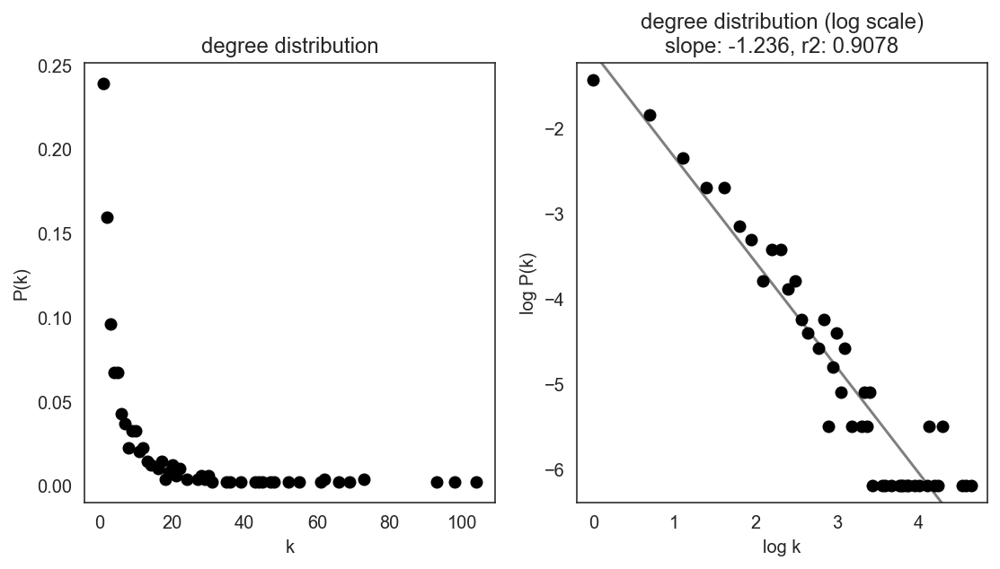

GABA_Pro


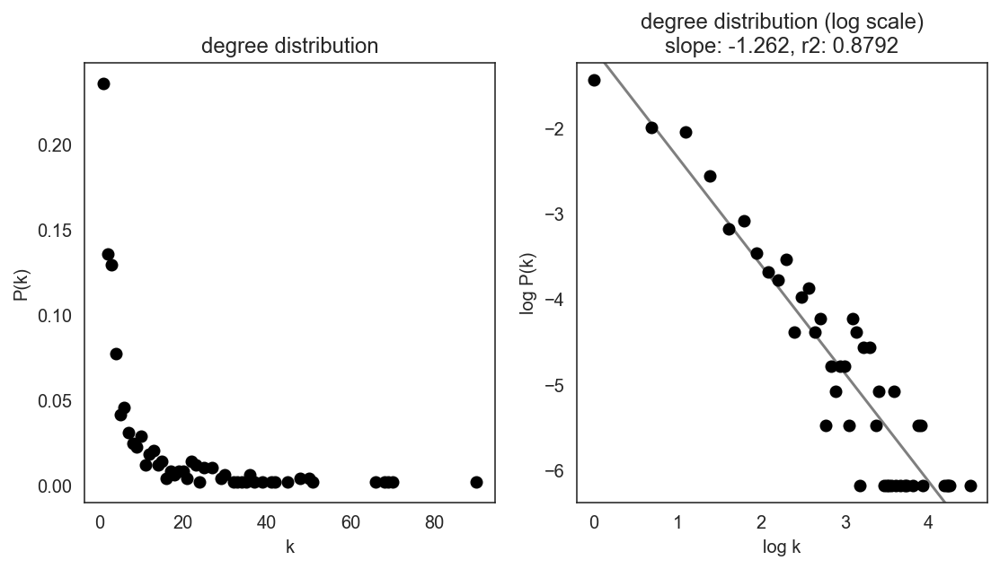

IN


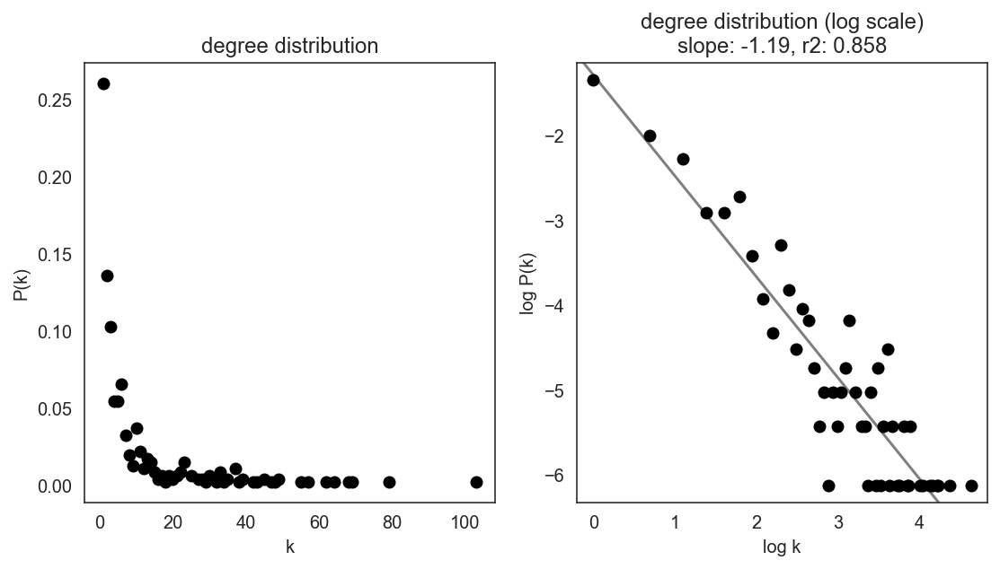

Leptomeningeal cell


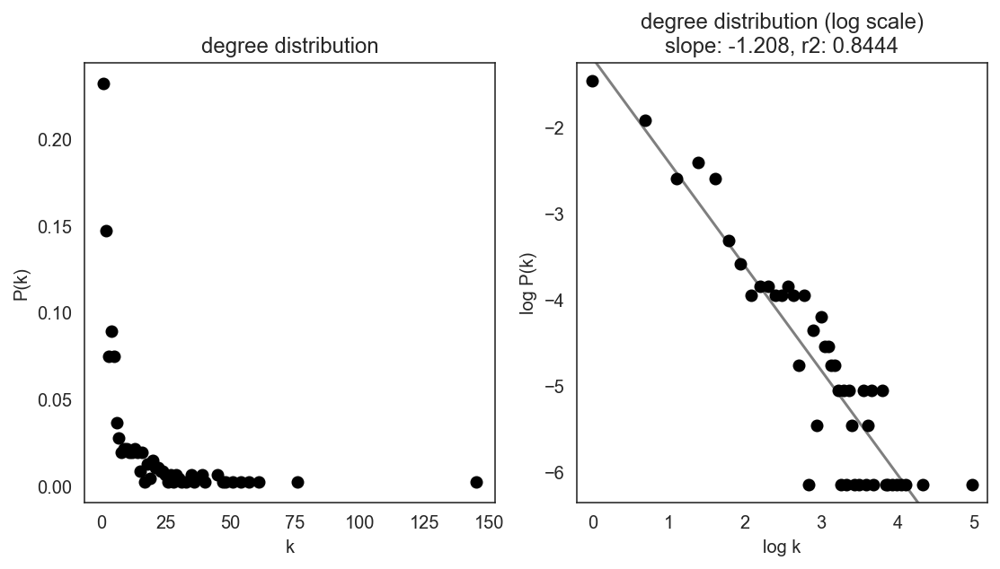

Mes.Isl1


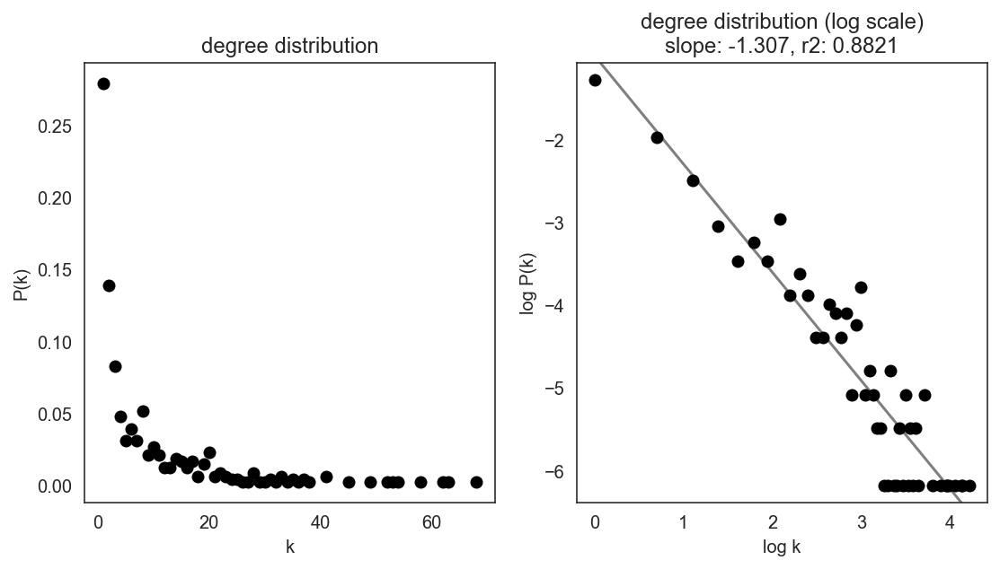

Microglia


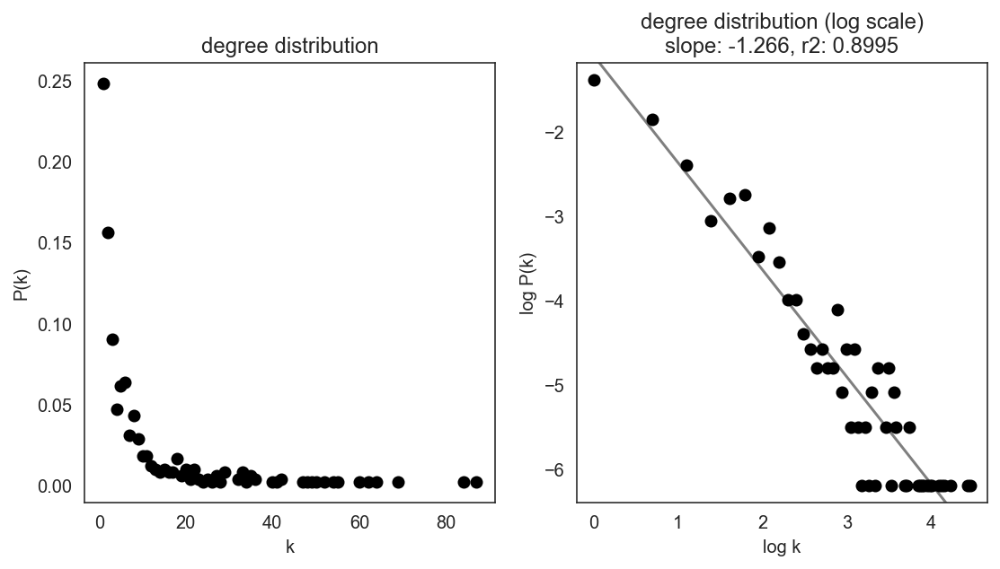

NPC


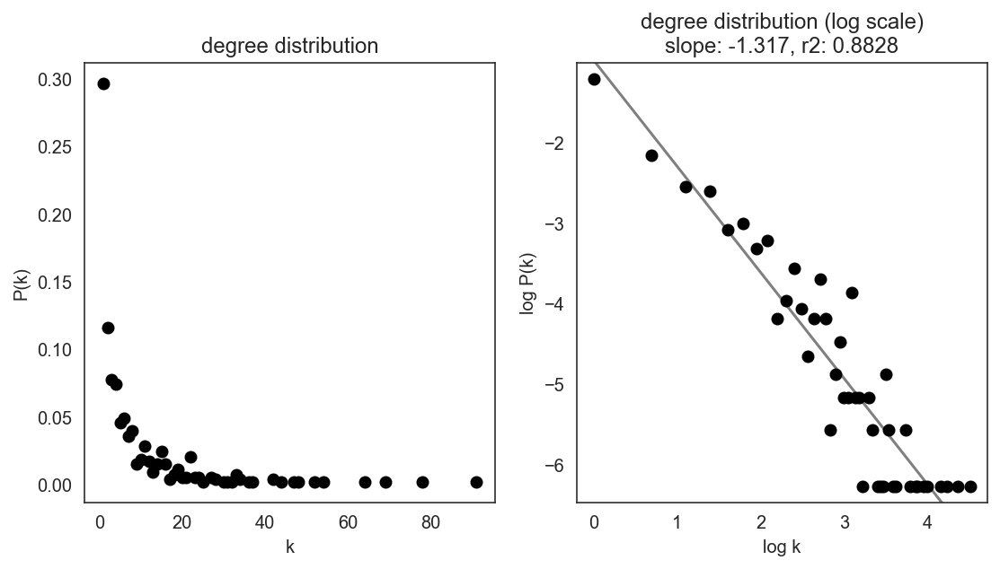

NPC_cyc


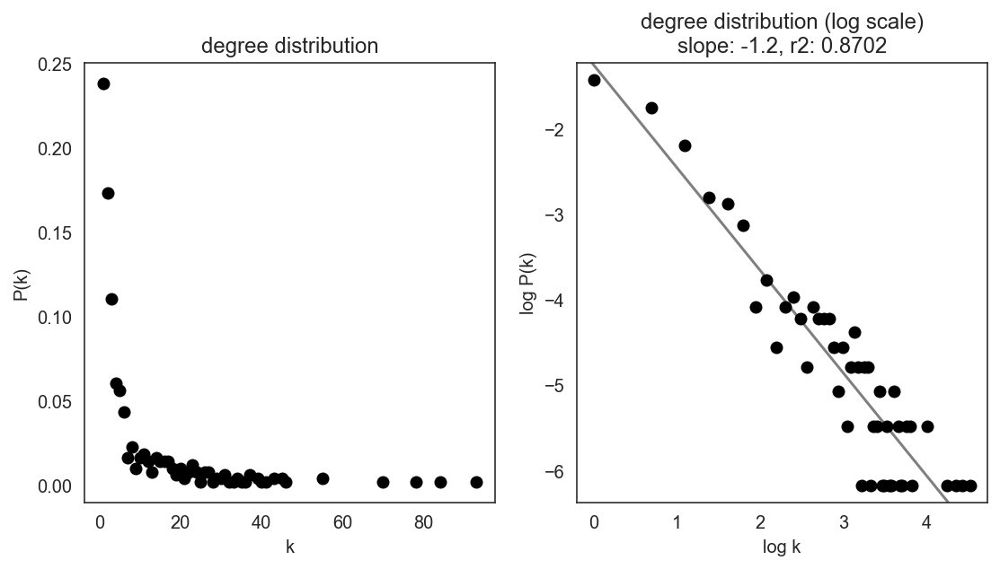

NPCa


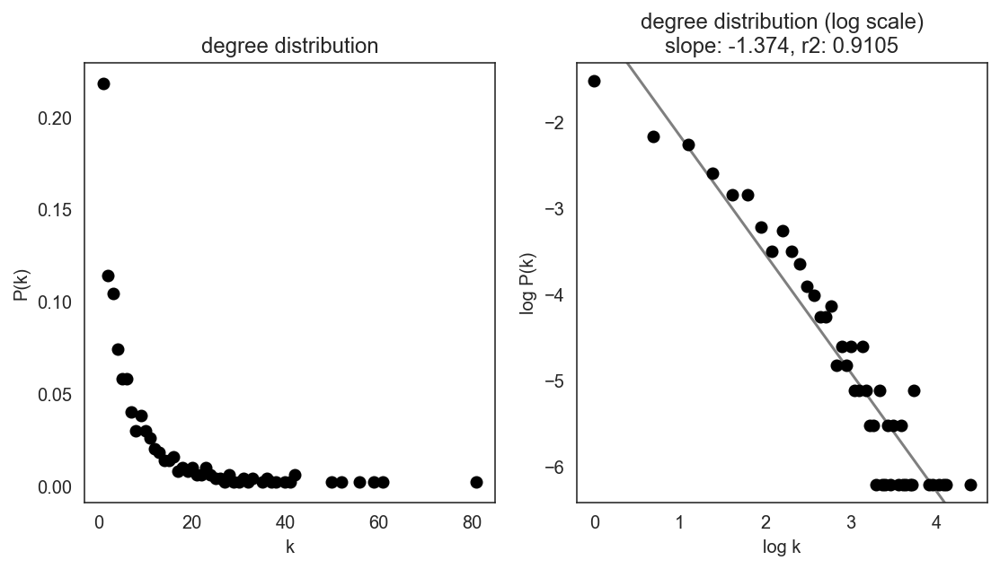

PC


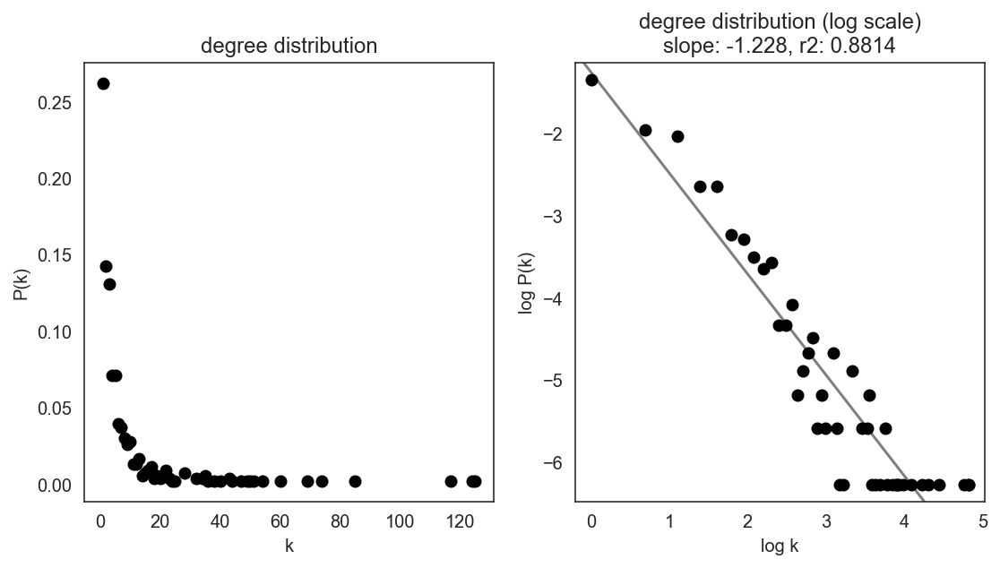

PTZ


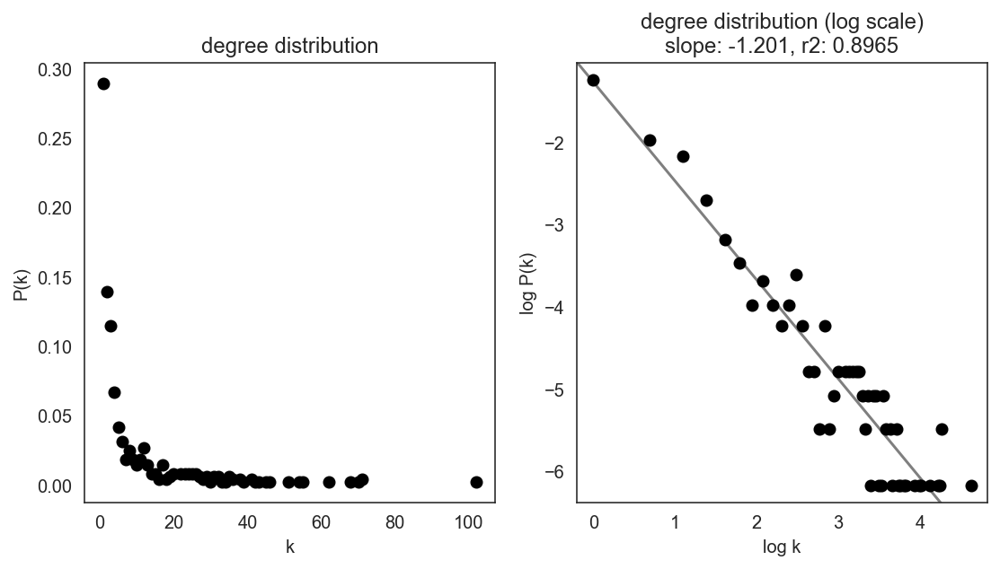

Pericytes


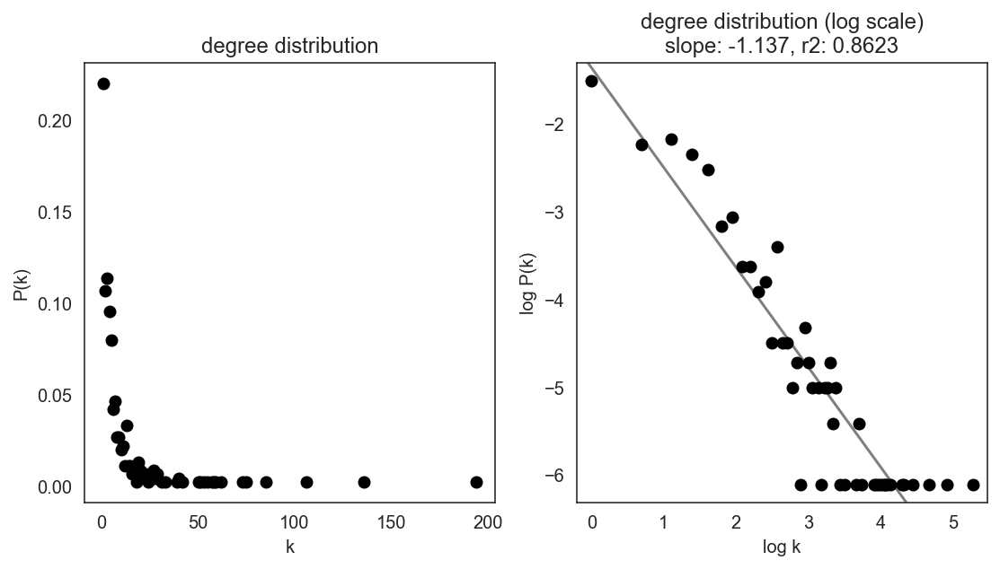

RL


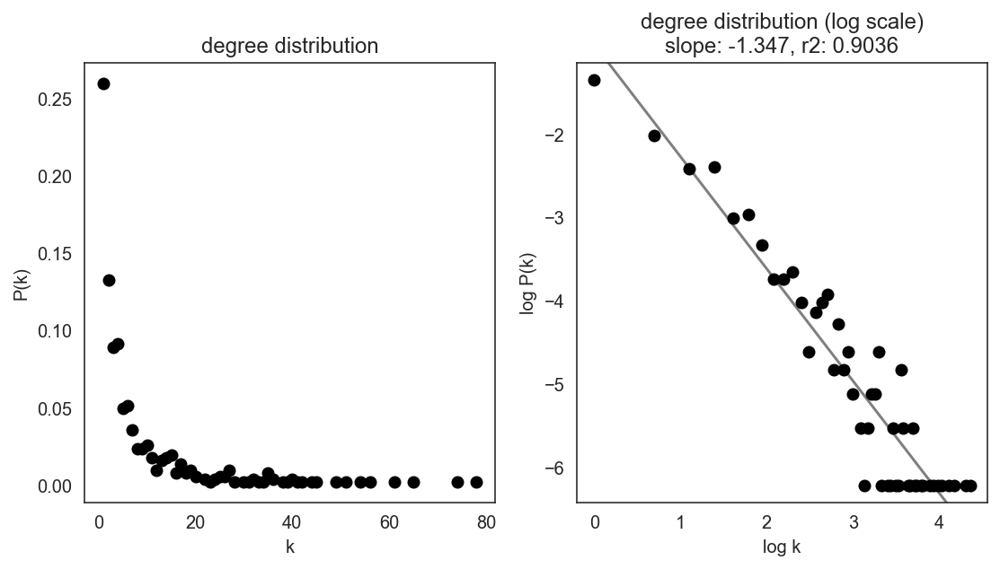

X_Otp


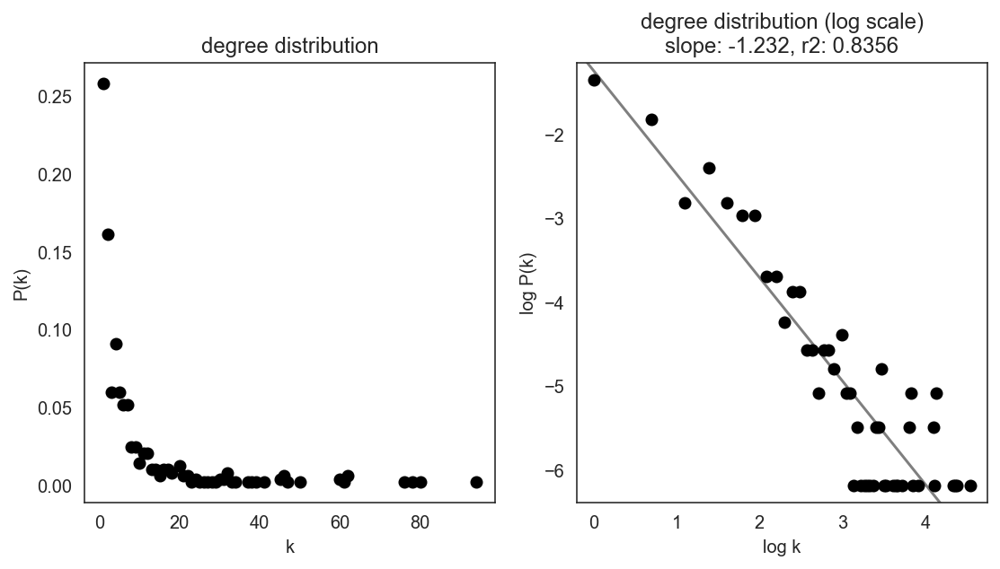

X_Otp_Pre


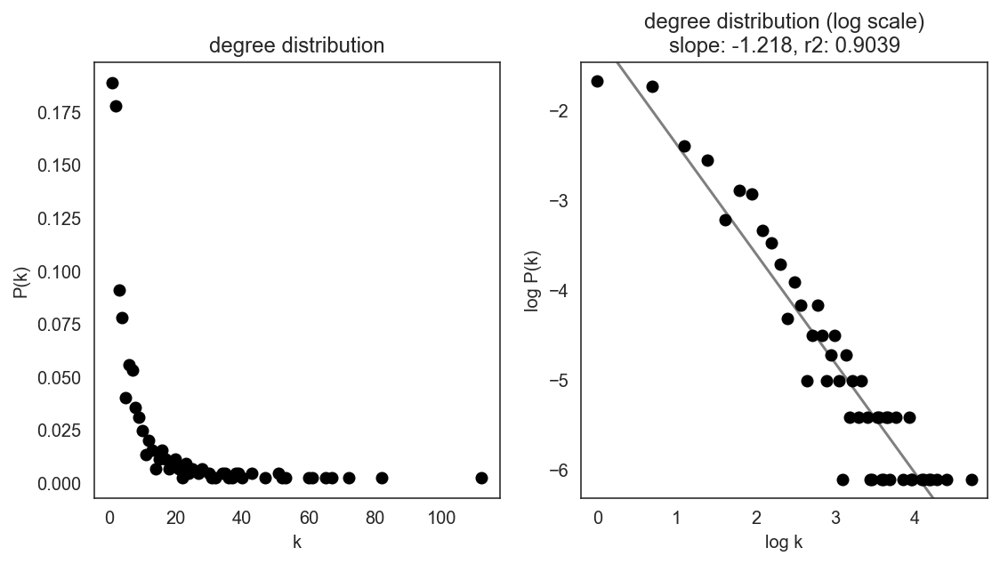

X_Tlx3


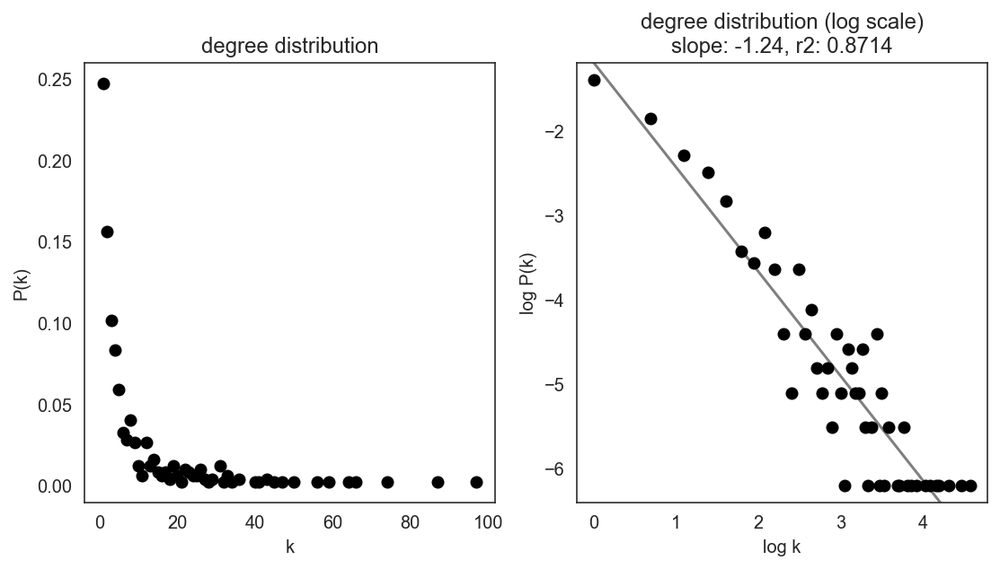

In [34]:
links.plot_degree_distributions(plot_model=True, save=f"{save_folder}/degree_distribution/")
#links.plot_degree_distributions(plot_model=True)

In [35]:
plt.rcParams["figure.figsize"] = [6, 4.5]

## 5.3. Calculate netowrk score

Next, several network score are calculated with R packages.

In [36]:
# Calculate network scores. It takes several minutes.
links.get_score()

processing... batch 1/2
CN_Th: finished.
CN_early1: finished.
CN_early2: finished.
CN_gaba: finished.
CN_late: finished.
Endothelium: finished.
Eryth: finished.
GABA_Pre: finished.
GABA_Pro: finished.
IN: finished.
Leptomeningeal cell: finished.
Mes.Isl1: finished.
processing... batch 2/2
Microglia: finished.
NPC: finished.
NPC_cyc: finished.
NPCa: finished.
PC: finished.
PTZ: finished.
Pericytes: finished.
RL: finished.
X_Otp: finished.
X_Otp_Pre: finished.
X_Tlx3: finished.


The score is stored as a attribute called "merged_score", and the score will also be saved in a folder in your computer.

In [37]:
links.merged_score.head()

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
Myef2,19,0,19,0.035088,0.032638,0.038462,0.000000,0.038462,0,0.000017,0.082835,0.001585,-0.221053,3.245529,17,2,3.287885,0.542936,Connector Hub,CN_Th
Hsf2,7,0,7,0.000000,0.000000,0.014170,0.000000,0.014170,0,0.000017,0.052473,0.001585,-0.221053,3.245529,15,2,0.419135,0.571429,Peripheral,CN_Th
Lmo2,8,0,8,0.000000,0.000000,0.016194,0.000000,0.016194,0,0.000004,0.109064,0.001585,-0.221053,3.245529,3,4,-0.014114,0.562500,Peripheral,CN_Th
Lhx2,69,18,51,0.090367,0.141980,0.139676,0.036437,0.103239,2567,0.000017,0.930192,0.003502,-0.221053,3.245529,3,3,3.411945,0.666016,Connector Hub,CN_Th
Pou3f4,34,5,29,0.114082,0.183337,0.068826,0.010121,0.058704,535,0.000017,0.381274,0.002190,-0.221053,3.245529,6,1,1.686851,0.549428,Peripheral,CN_Th


## 6.4. Save

Save processed GRN.

In [38]:
# Save Links object.
links.to_hdf5(file_path="data/links_umap.celloracle.links")

# Load Links object.
#links = co.load_hdf5(file_path="data/links_umap.celloracle.links")

In [39]:
pd.DataFrame(links.merged_score).to_csv("tables/Network_scores.csv")

# 7. Network analysis; Network score for each gene

## 7.1. Network score in each cluster


The centrality score is used to identify key regulatory genes because centrality is one of the important indicators of network structure (https://en.wikipedia.org/wiki/Centrality). 


In [41]:
# Check cluster name
links.cluster

['CN_Th',
 'CN_early1',
 'CN_early2',
 'CN_gaba',
 'CN_late',
 'Endothelium',
 'Eryth',
 'GABA_Pre',
 'GABA_Pro',
 'IN',
 'Leptomeningeal cell',
 'Mes.Isl1',
 'Microglia',
 'NPC',
 'NPC_cyc',
 'NPCa',
 'PC',
 'PTZ',
 'Pericytes',
 'RL',
 'X_Otp',
 'X_Otp_Pre',
 'X_Tlx3']

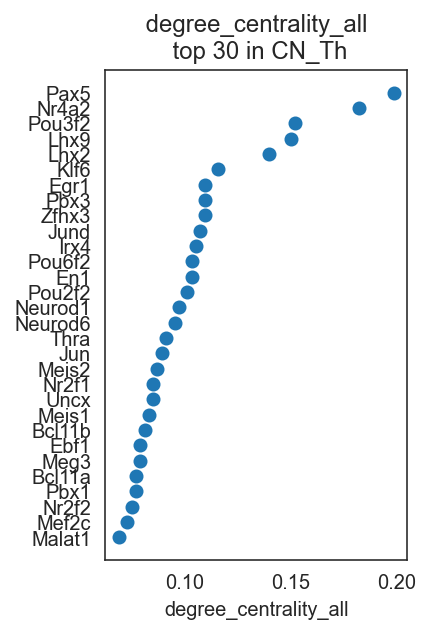

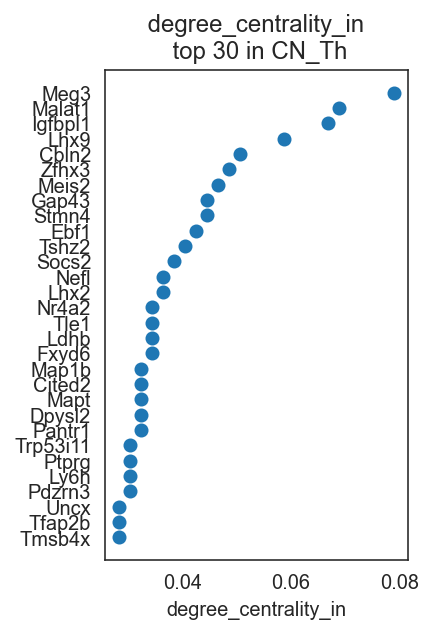

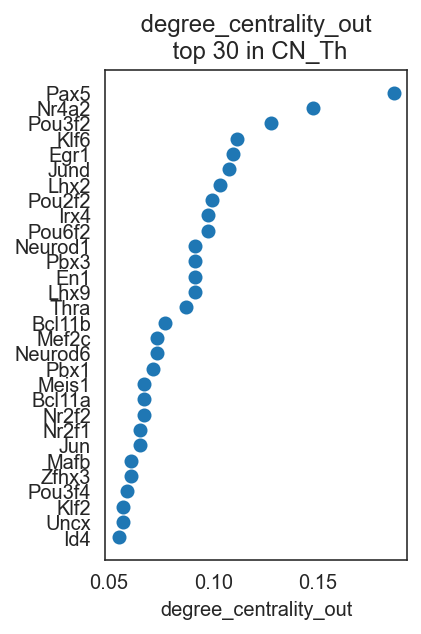

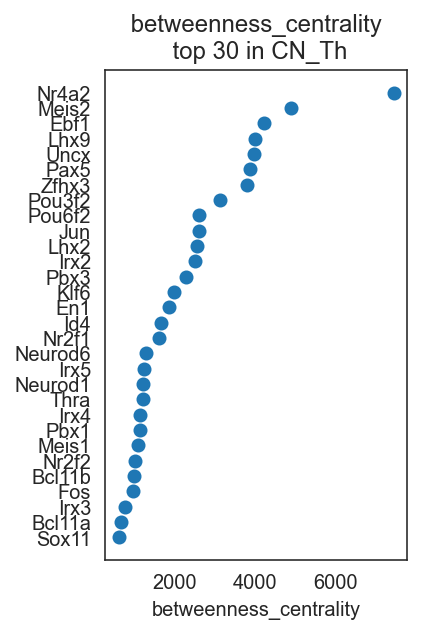

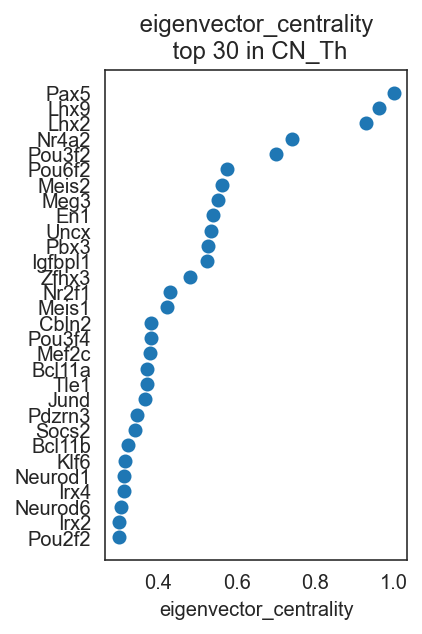

...

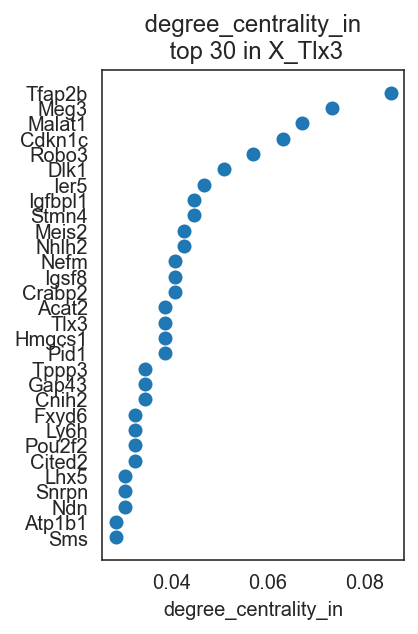

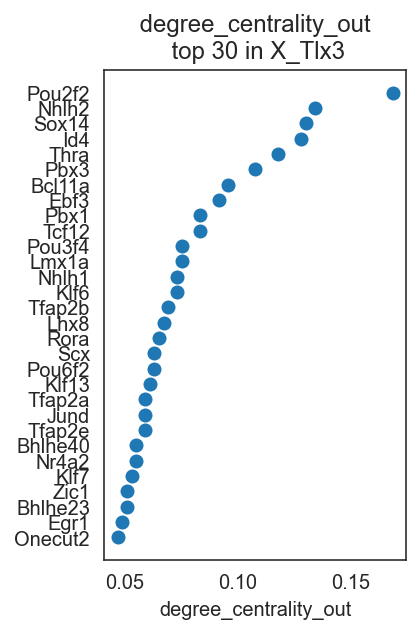

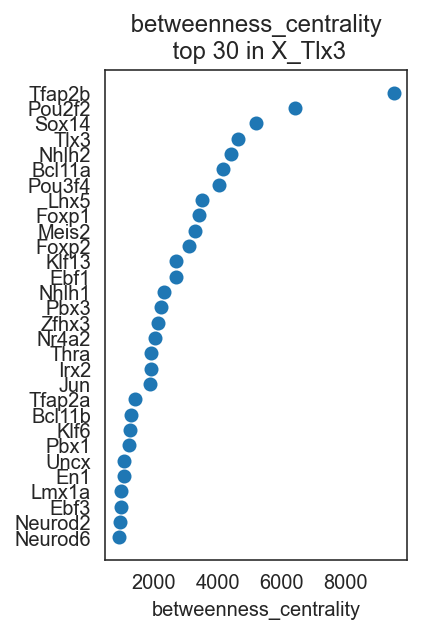

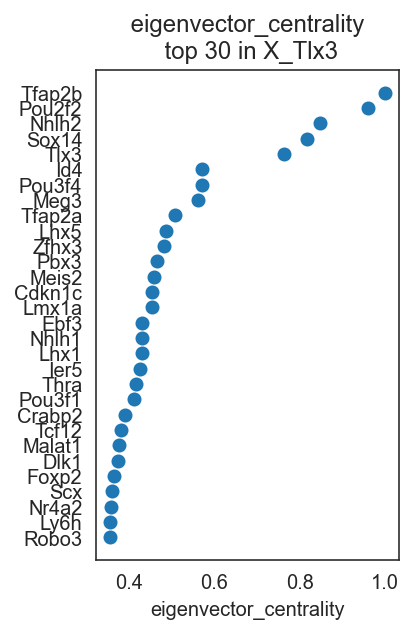

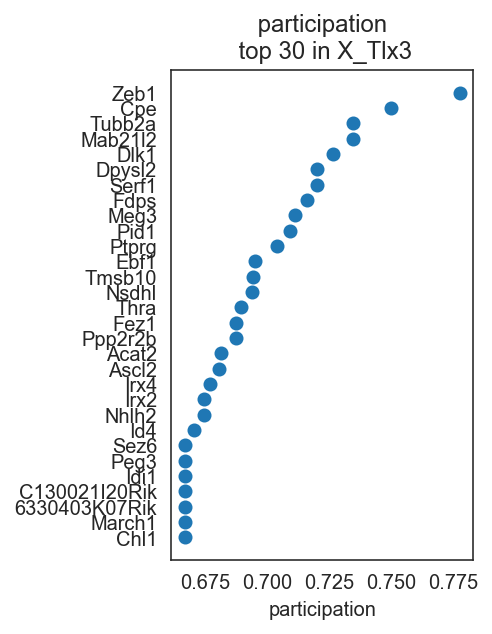

In [42]:
# Visualize top n-th genes that have high scores.
for n in links.cluster:
    links.plot_scores_as_rank(cluster= n, n_gene=30, save=f"{save_folder}/ranked_score")


## 7.2. Network score comparison between two clusters


In [7]:
co.network_analysis.gene_analysis.settings["save_figure_as"] = "pdf" 
co.network_analysis.network_structure_analysis.settings["save_figure_as"] = "pdf"

In [20]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [49]:
links.links_dict.keys()

dict_keys(['CN_Th', 'CN_early1', 'CN_early2', 'CN_gaba', 'CN_late', 'Endothelium', 'Eryth', 'GABA_Pre', 'GABA_Pro', 'IN', 'Leptomeningeal cell', 'Mes.Isl1', 'Microglia', 'NPC', 'NPC_cyc', 'NPCa', 'PC', 'PTZ', 'Pericytes', 'RL', 'X_Otp', 'X_Otp_Pre', 'X_Tlx3'])

In [72]:
links.links_dict.keys()

dict_keys(['CN_Th', 'CN_early1', 'CN_early2', 'CN_gaba', 'CN_late', 'Endothelium', 'Eryth', 'GABA_Pre', 'GABA_Pro', 'IN', 'Leptomeningeal cell', 'Mes.Isl1', 'Microglia', 'NPC', 'NPC_cyc', 'NPCa', 'PC', 'PTZ', 'Pericytes', 'RL', 'X_Otp', 'X_Otp_Pre', 'X_Tlx3'])

In [ ]:
mylist = ['a', 'b', 'c', 'd', 'e']
myorder = [3, 2, 0, 1, 4]
mylist = [mylist[i] for i in myorder]

By comparing network scores between two clusters, we can analyze differences in GRN structure.

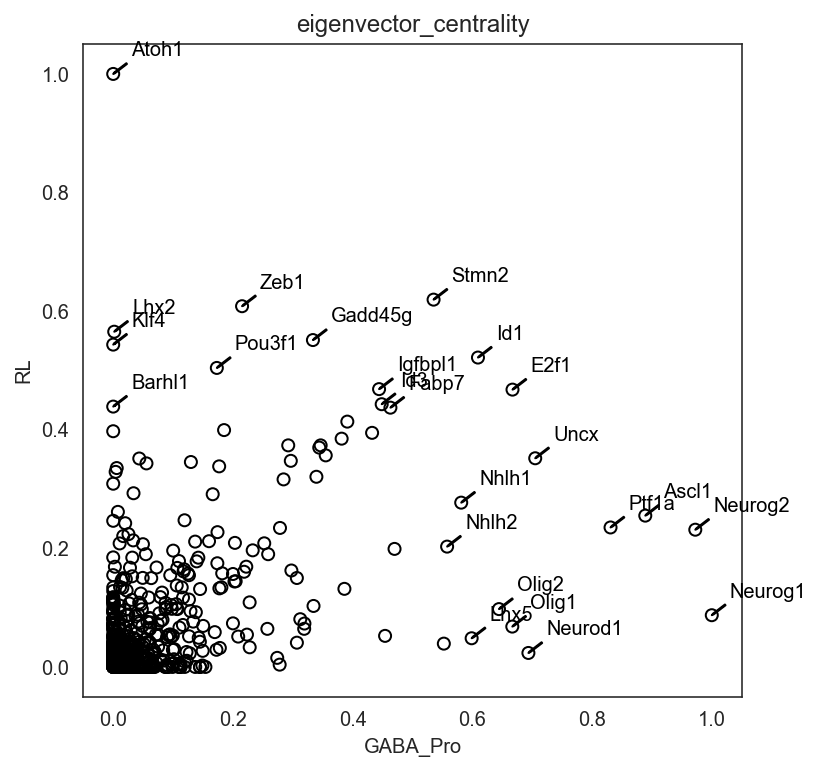

In [68]:
plt.figure(figsize=(5.9,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="GABA_Pro", cluster2="RL", 
                               percentile=98, save=f"{save_folder}/score_comparison")

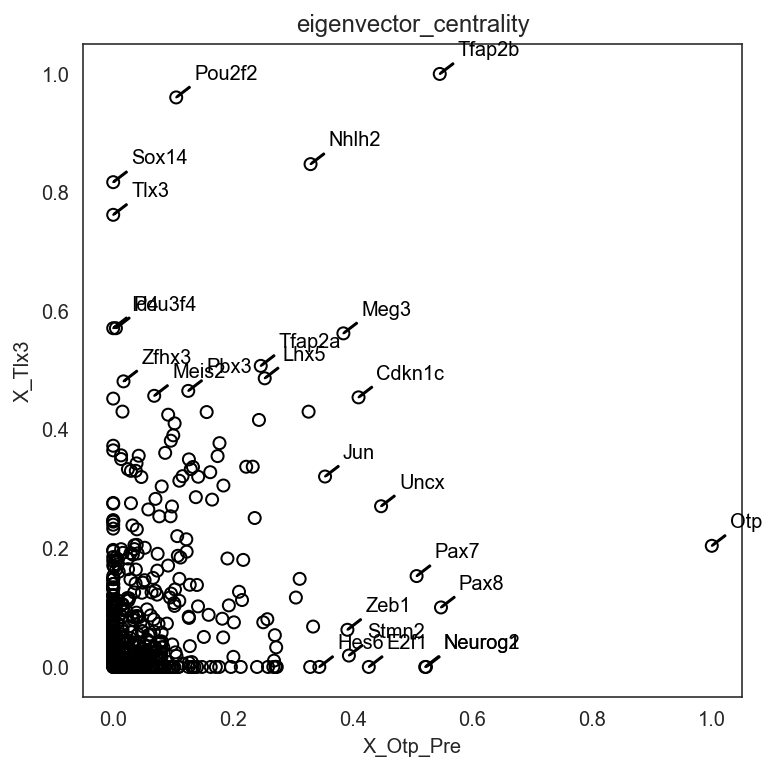

In [69]:
plt.figure(figsize=(5.9,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="X_Otp_Pre", cluster2="X_Tlx3",
                               percentile=98, save=f"{save_folder}/score_comparison")

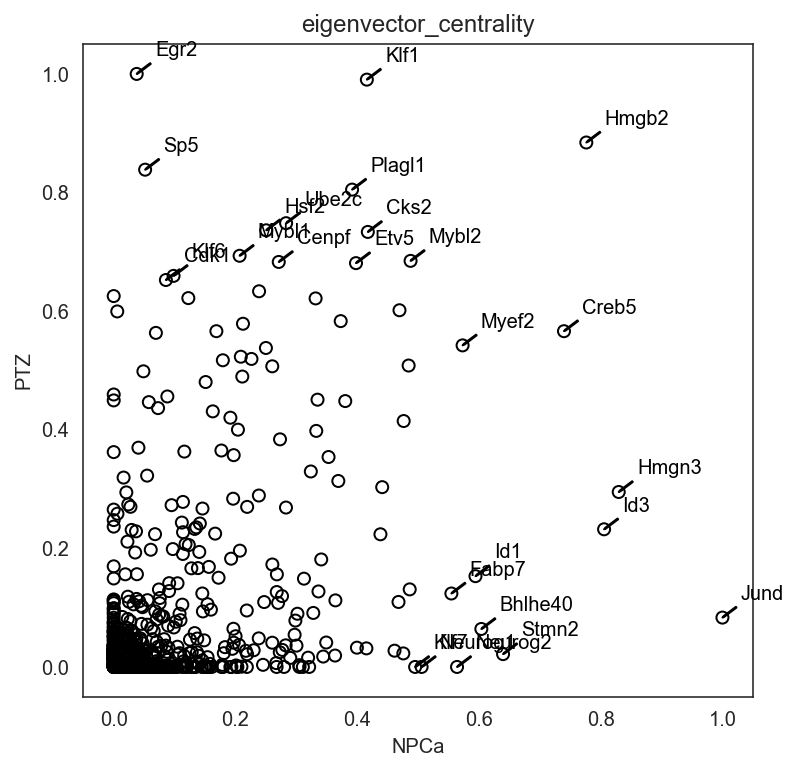

In [52]:
plt.figure(figsize=(6,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="NPCa", cluster2="PTZ", 
                               percentile=98, save=f"{save_folder}/score_comparison")

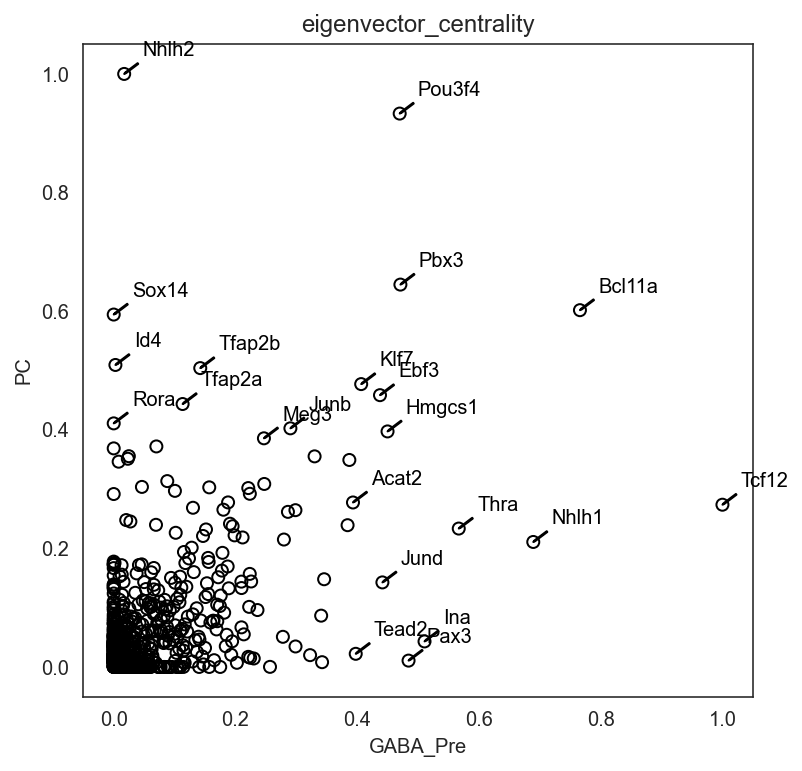

In [53]:
plt.figure(figsize=(6,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="GABA_Pre", cluster2="PC", 
                               percentile=98, save=f"{save_folder}/score_comparison")

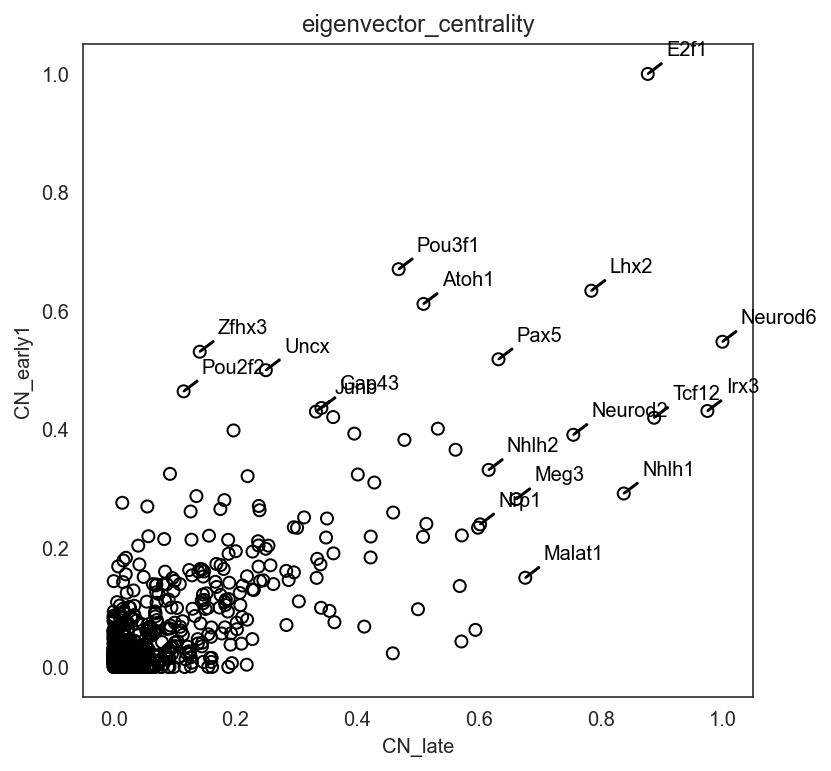

In [54]:
plt.figure(figsize=(6,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="CN_late", cluster2="CN_early1", 
                               percentile=98, save=f"{save_folder}/score_comparison")

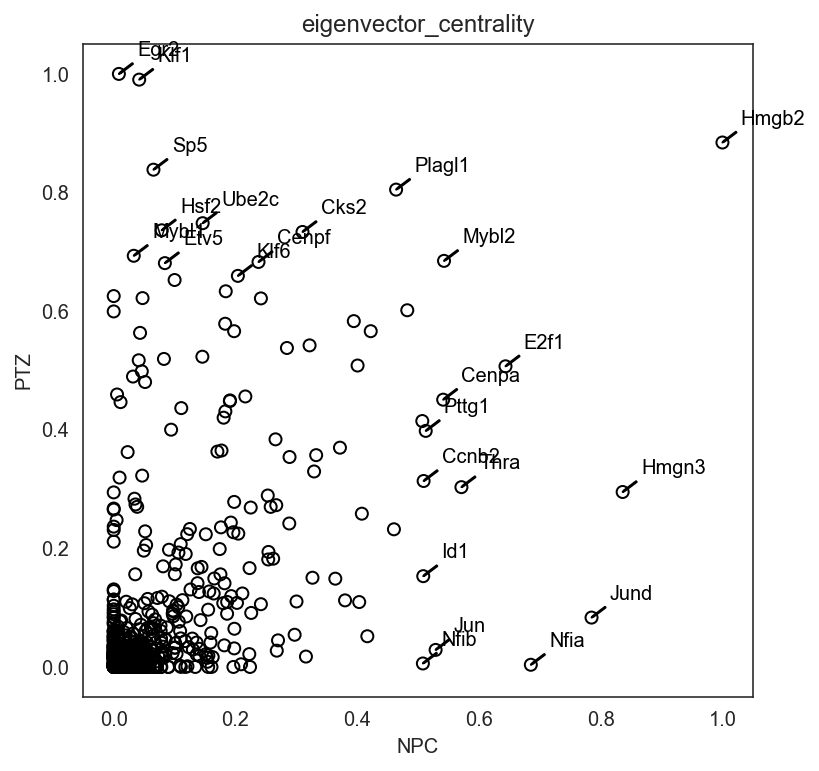

In [55]:
plt.figure(figsize=(6,6))
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="NPC", cluster2="PTZ", 
                               percentile=98, save=f"{save_folder}/score_comparison")

## 7.3. Network score dynamics
In the following session, we focus on how a gene's network score changes during the differentiation.

Ptf1a


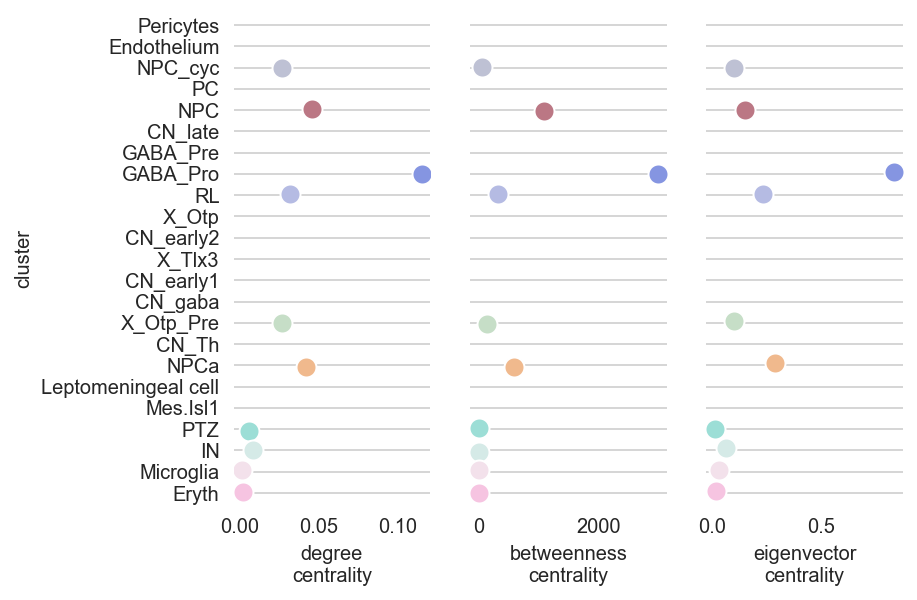

In [56]:
# Visualize Foxp2 network score dynamics
links.plot_score_per_cluster(goi="Ptf1a", save=f"{save_folder}/network_score_per_gene/")

Atoh1


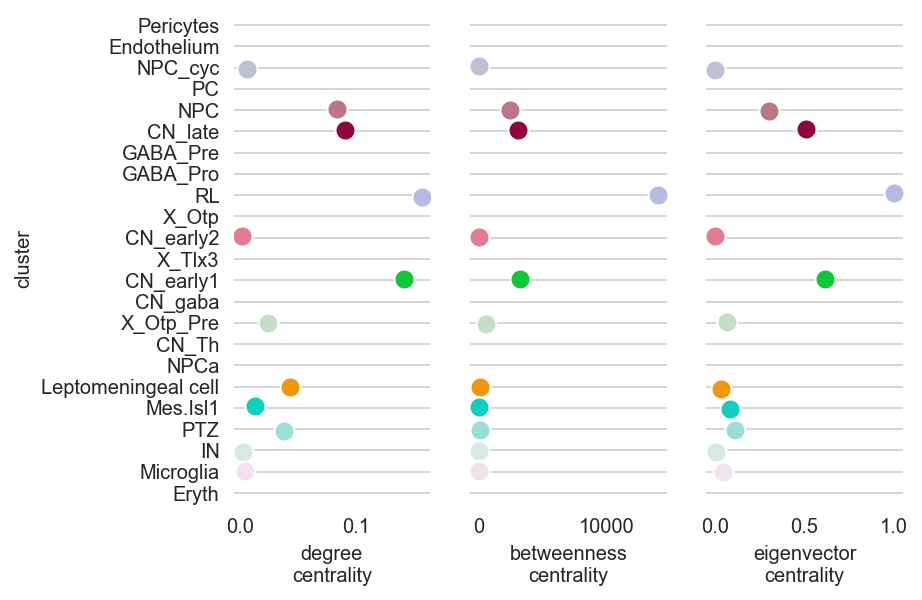

In [57]:
links.plot_score_per_cluster(goi="Atoh1", save=f"{save_folder}/network_score_per_gene/")

Ascl1


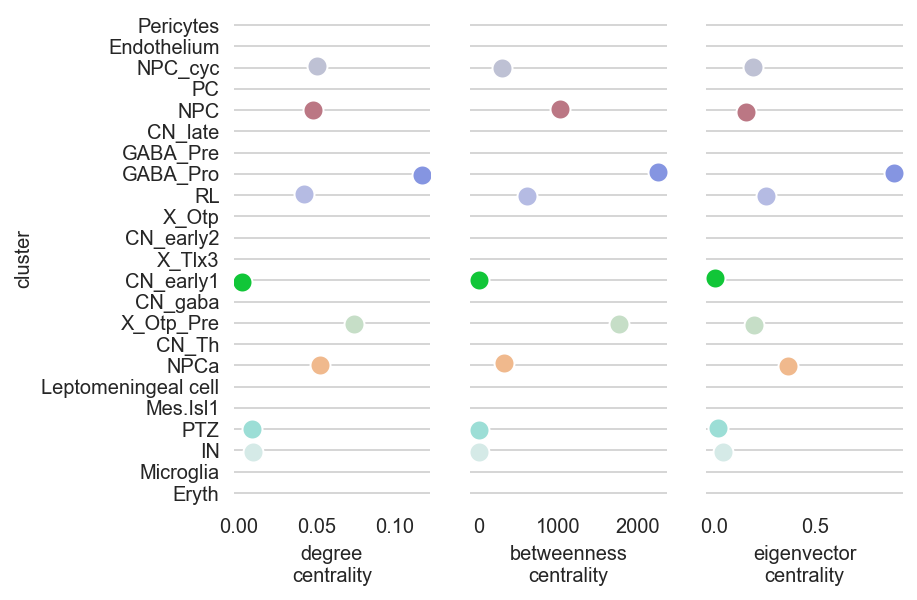

In [58]:
links.plot_score_per_cluster(goi="Ascl1", save=f"{save_folder}/network_score_per_gene/")

Neurog1


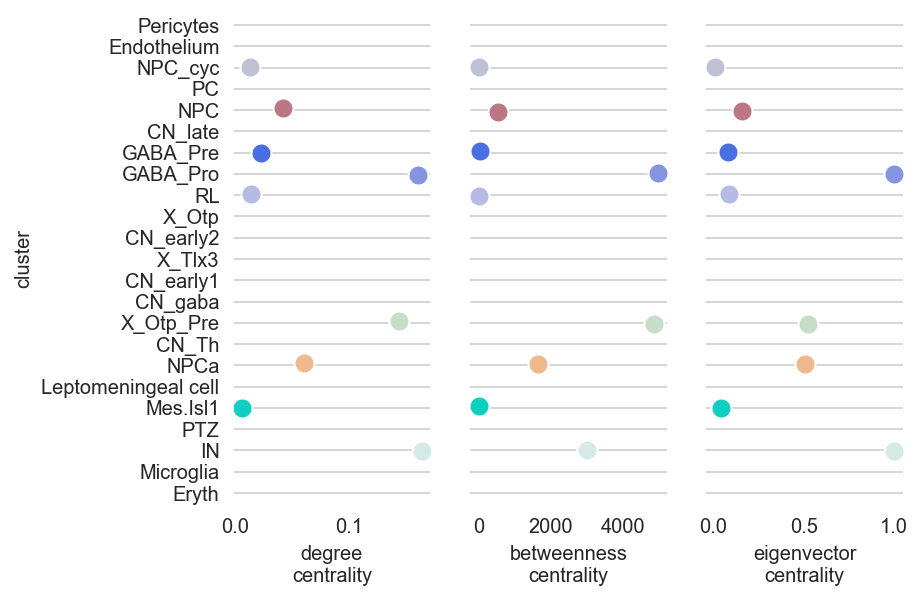

In [59]:
links.plot_score_per_cluster(goi="Neurog1", save=f"{save_folder}/network_score_per_gene/")

You can check filtered network edge as follows.

In [45]:
cluster_name = "GABA_Pro"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

,source,target,coef_mean,coef_abs,p,-logp
35156,Myef2,Cbx3,0.128681,0.128681,1.267033e-24,23.897212
133497,Id1,Id3,0.106887,0.106887,5.716428e-13,12.242875
183381,Olig1,Neurog1,0.103482,0.103482,1.405775e-15,14.852084
274559,Neurog1,Stmn2,-0.093579,0.093579,1.716170e-20,19.765440
133531,Id2,Id3,0.091518,0.091518,1.490438e-16,15.826686


In [47]:
filtered_links_df[filtered_links_df.source == "Ptf1a"].to_csv("tables/targets_Ptf1a.csv")
filtered_links_df[filtered_links_df.source == "Ascl1"].to_csv("tables/targets_Ascl1.csv")

## 7.4. Gene cartography analysis

Gene cartography is a method for gene network analysis.
The method classifies gene into several groups using the network module structure and connections.
It provides us an insight about the role and regulatory mechanism for each gene. 
For more information on gene cartography, please refer to the following paper (https://www.nature.com/articles/nature03288).

The gene cartography will be calculated for the GRN in each cluster.
Thus we can know how the gene cartography change by comparing the the score between clusters.

CN_Th


<Figure size 576x576 with 0 Axes>

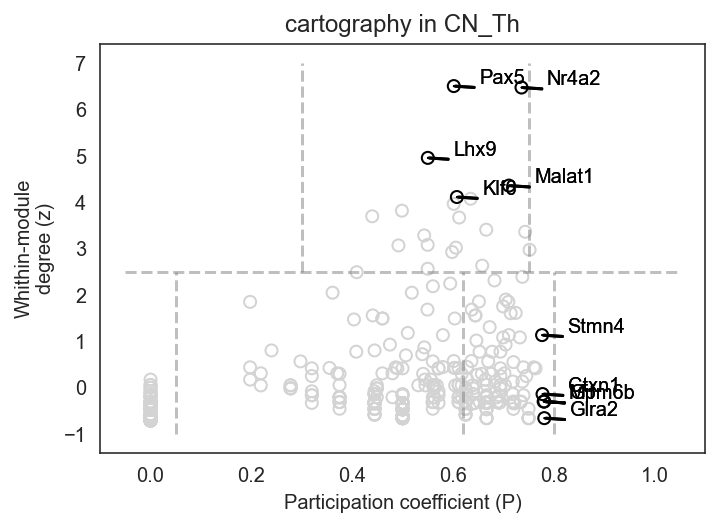

CN_early1


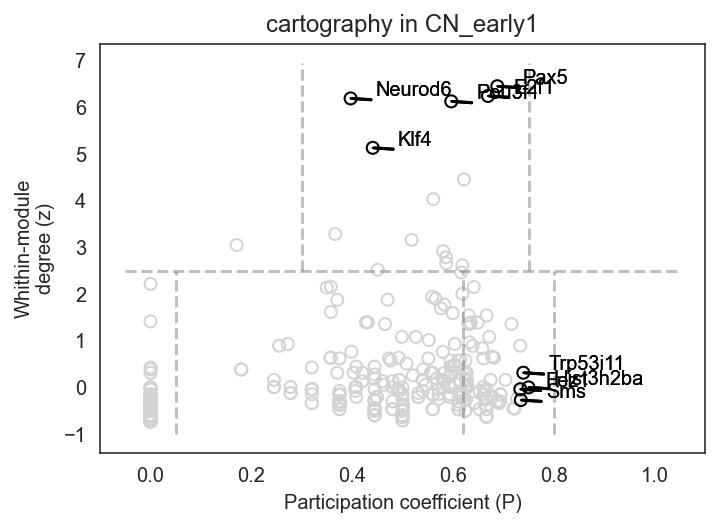

CN_early2


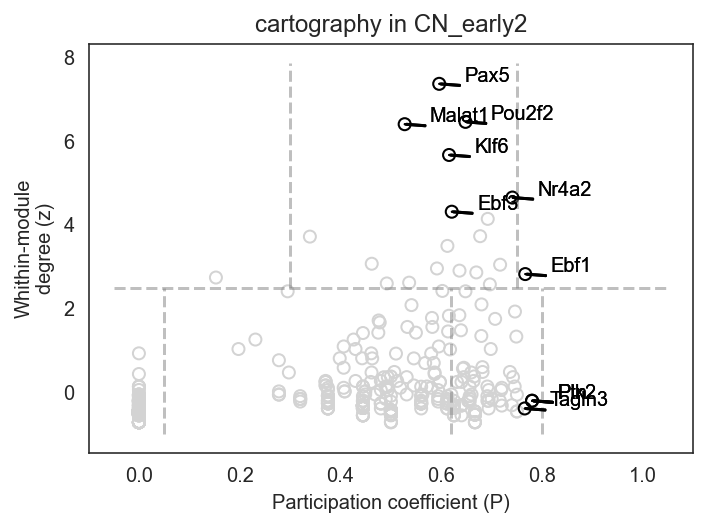

CN_gaba


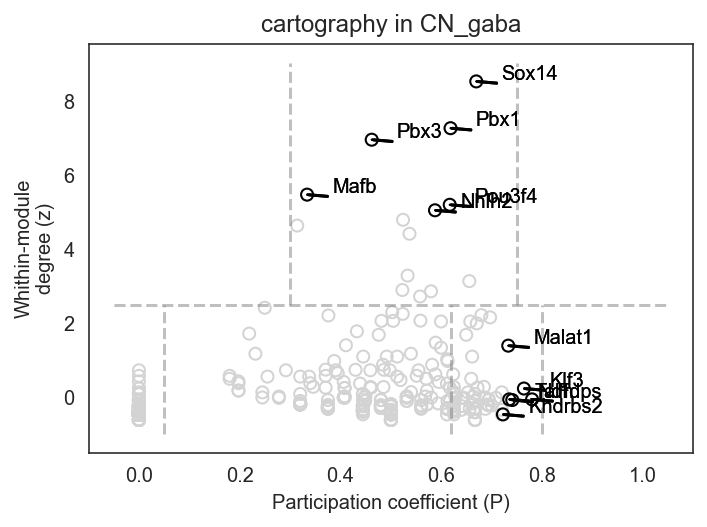

CN_late


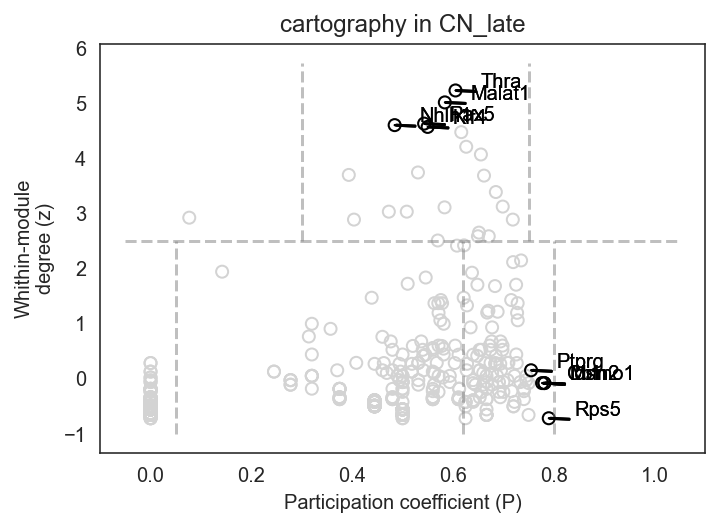

Endothelium


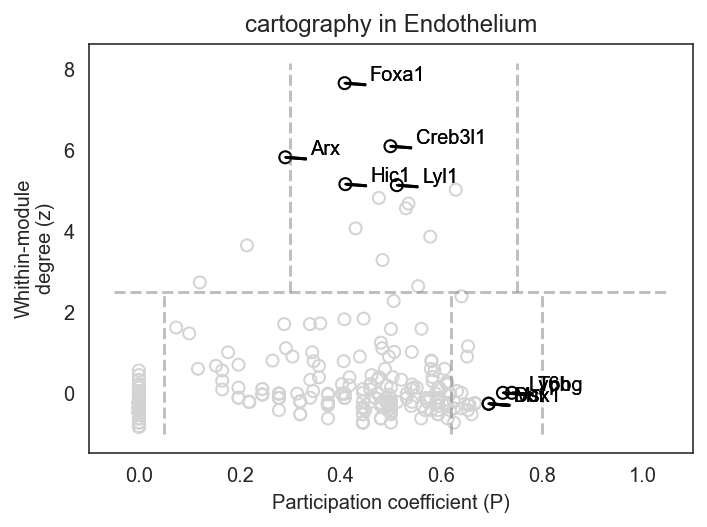

Eryth


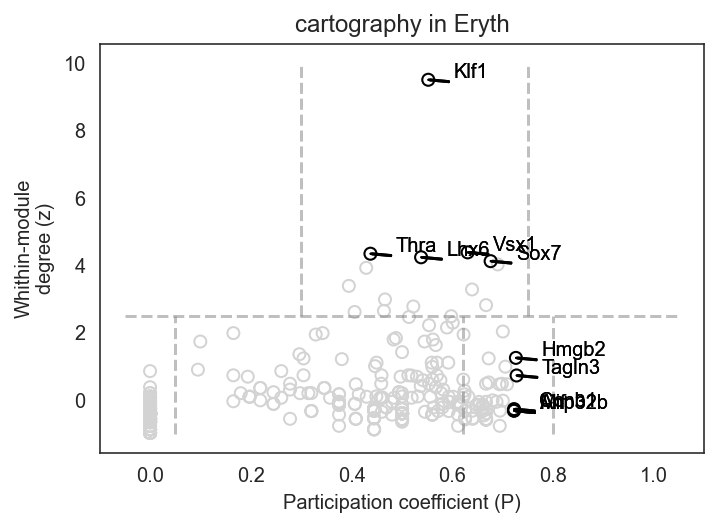

GABA_Pre


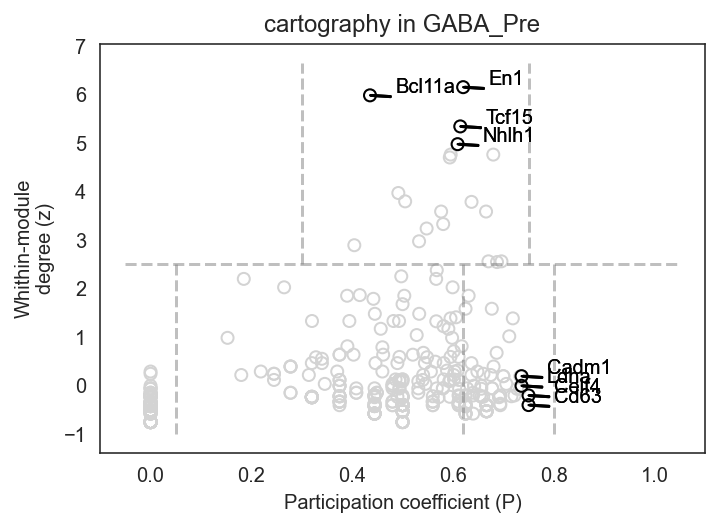

GABA_Pro


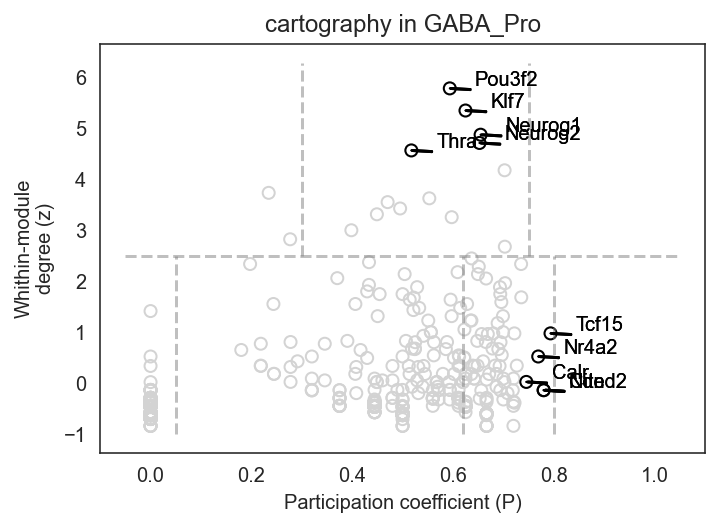

IN


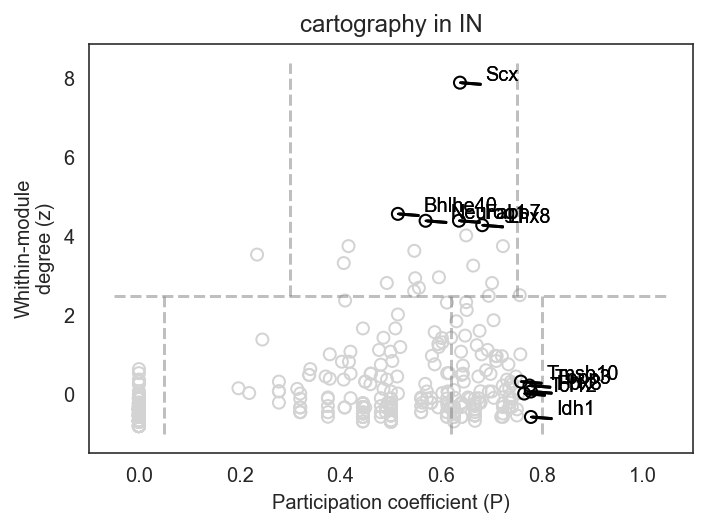

Leptomeningeal cell


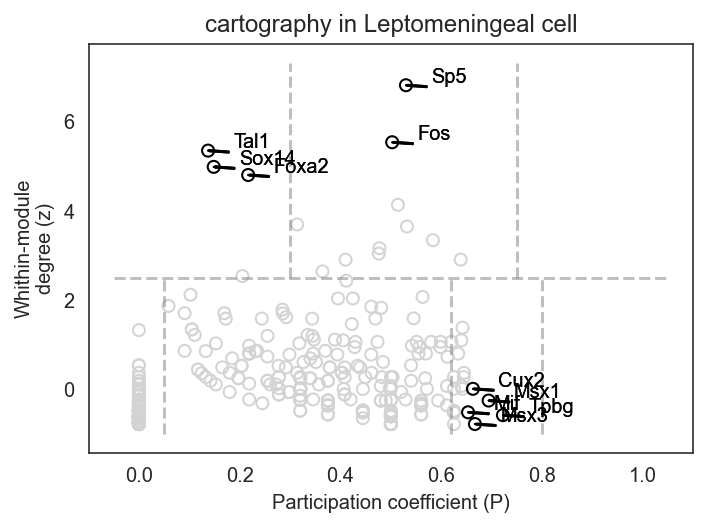

Mes.Isl1


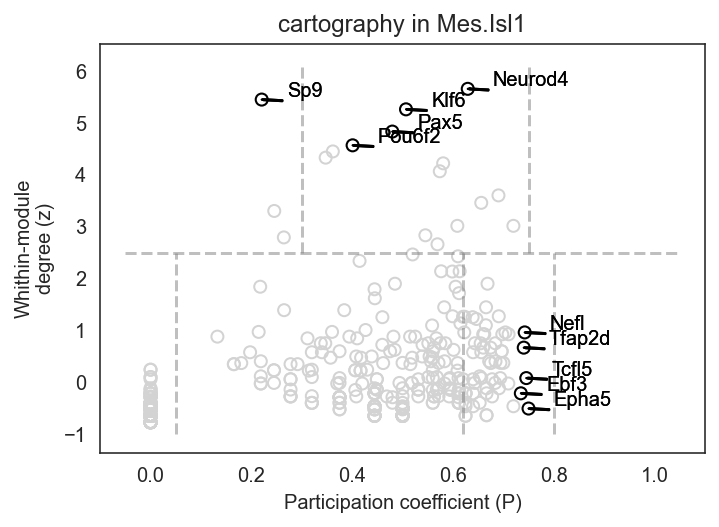

Microglia


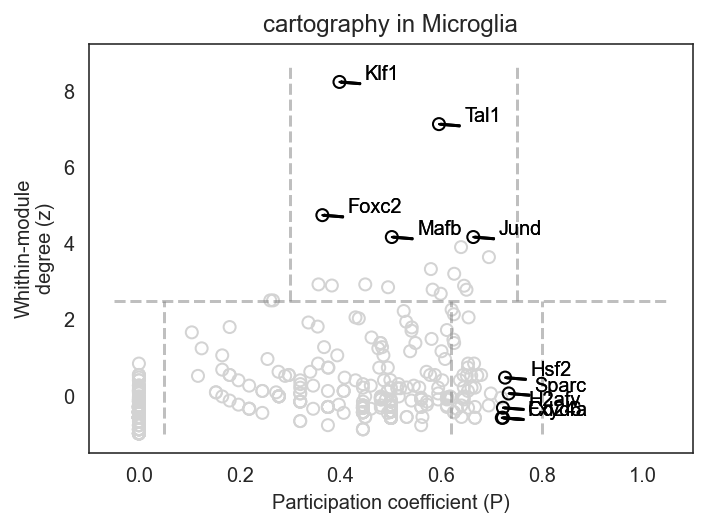

NPC


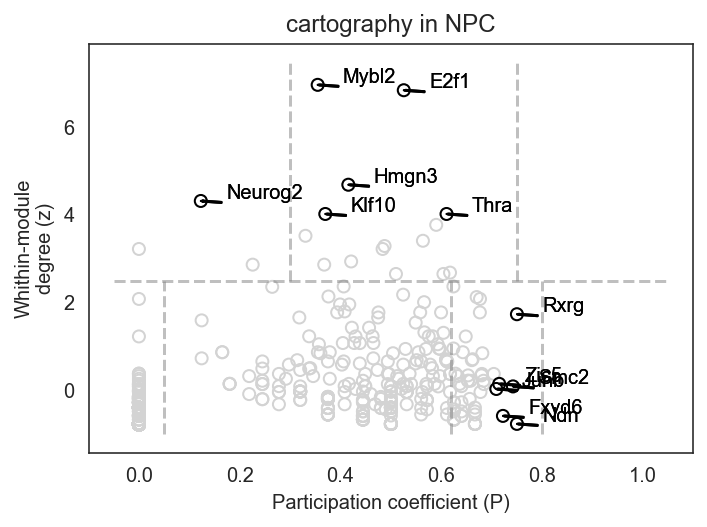

NPC_cyc


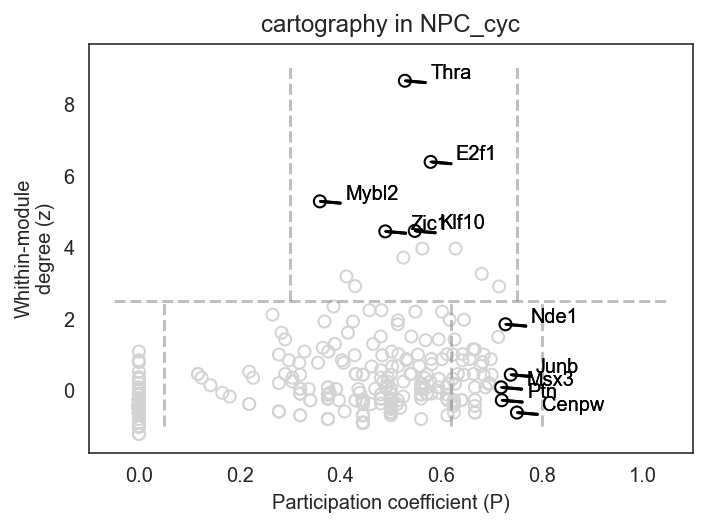

NPCa


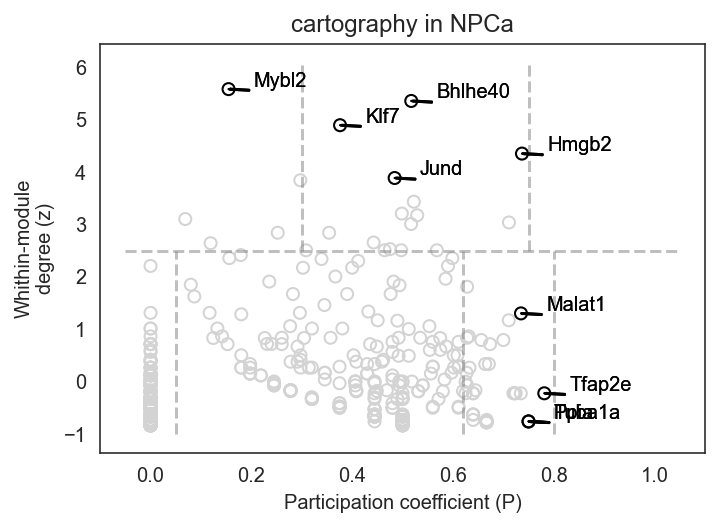

PC


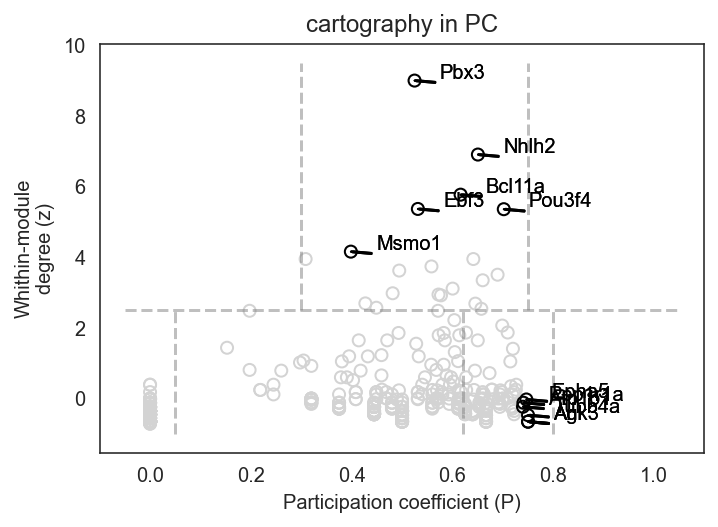

PTZ


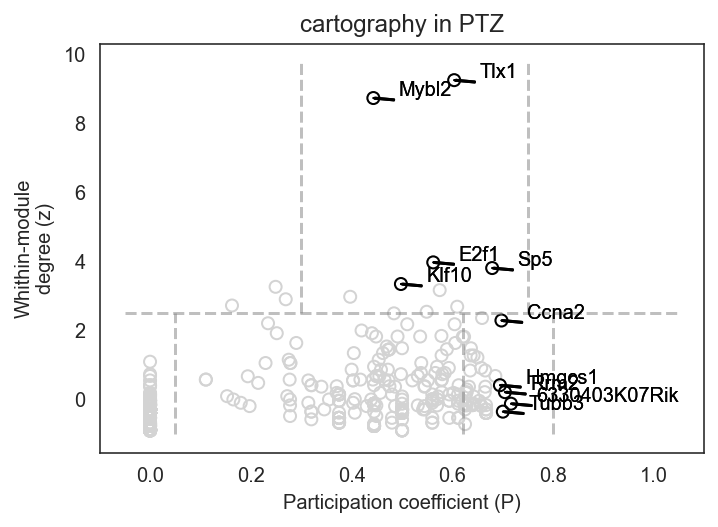

Pericytes


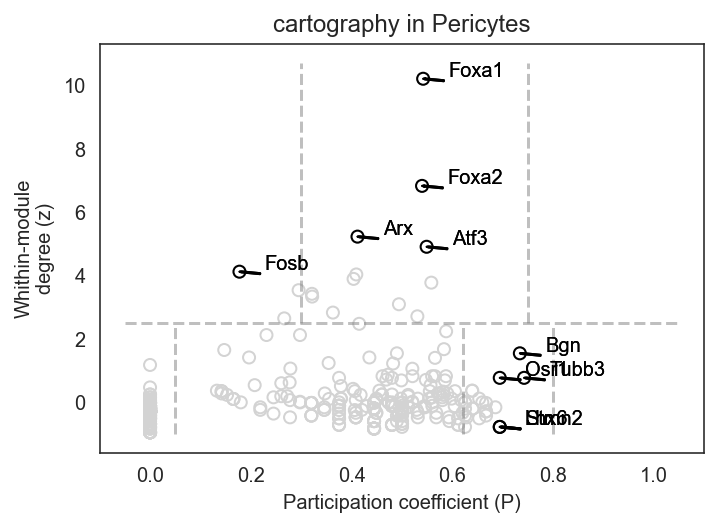

RL


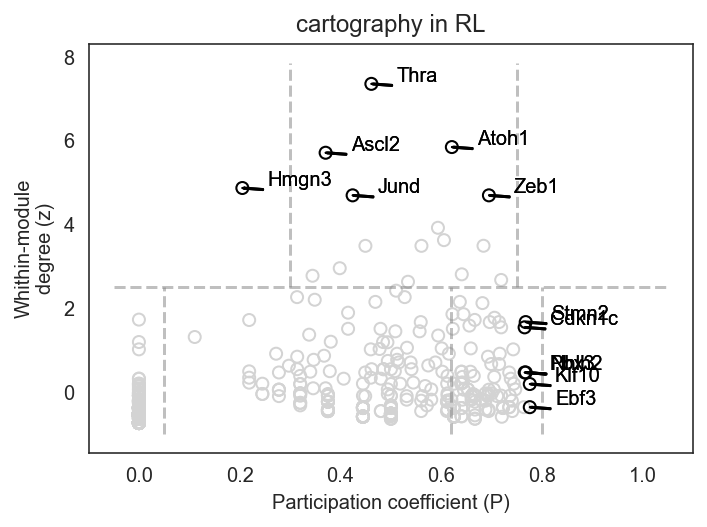

X_Otp


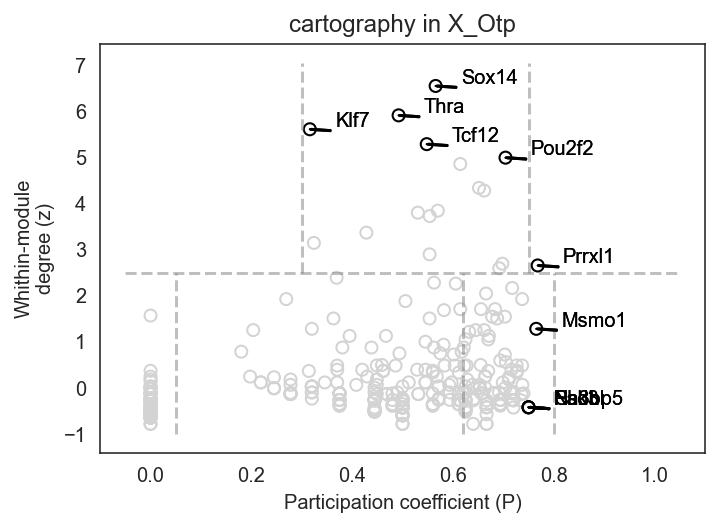

X_Otp_Pre


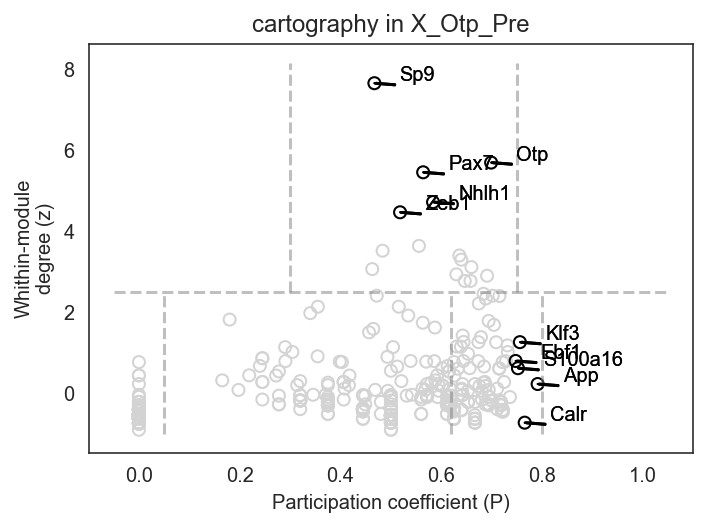

X_Tlx3


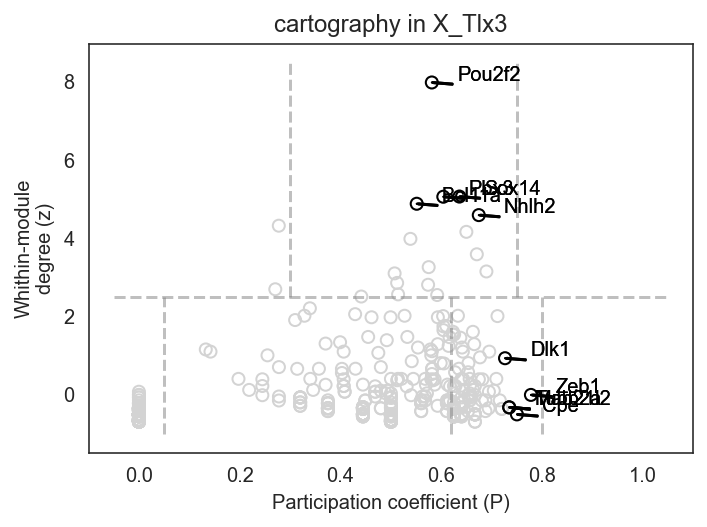

In [60]:
# Plot cartography as a scatter plot
plt.figure(figsize=(8,8))
links.plot_cartography_scatter_per_cluster(scatter=True,
                                           kde=False,
                                           gois=None,
                                           auto_gene_annot=True,
                                           percentile=99,
                                           args_dot={"n_levels": 105},
                                           args_line={"c":"gray"}, 
                                           save=f"{save_folder}/cartography")

CN_Th


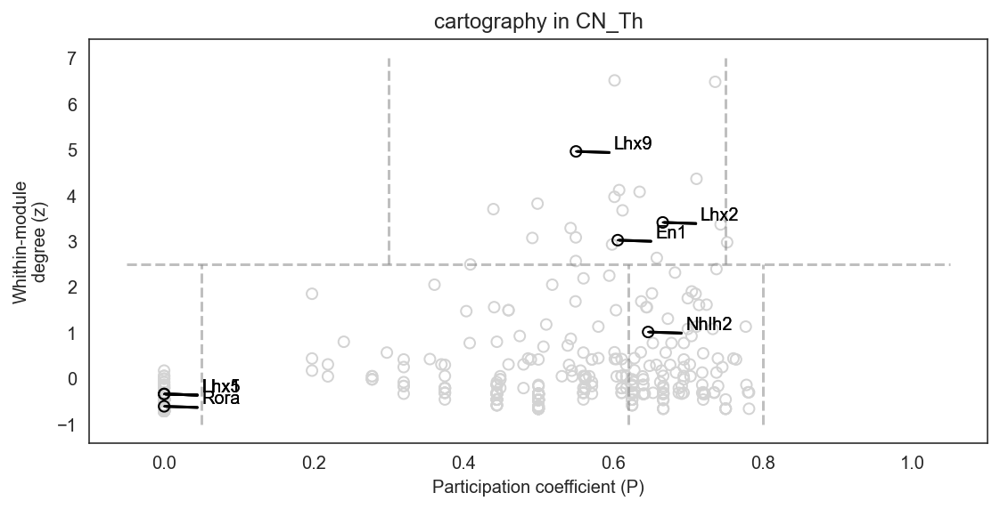

CN_early1


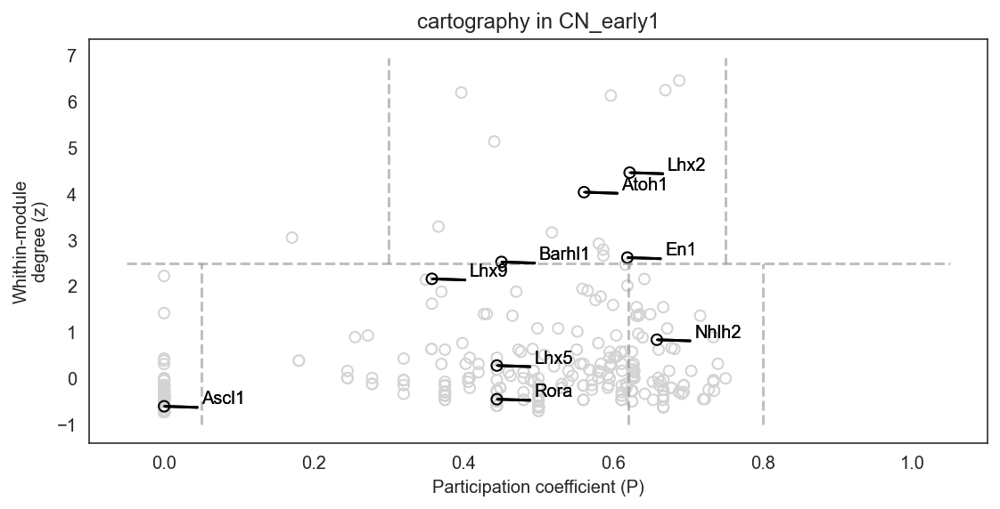

CN_early2


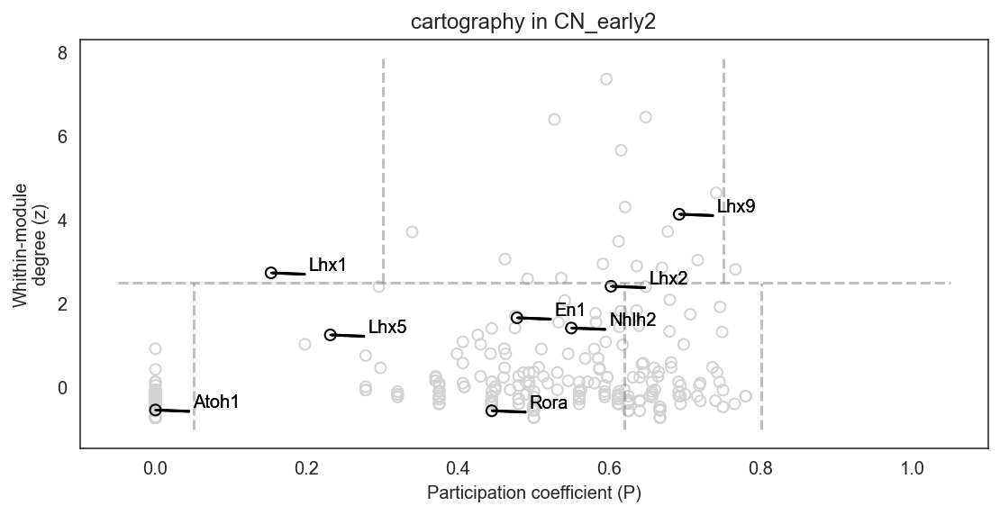

CN_gaba


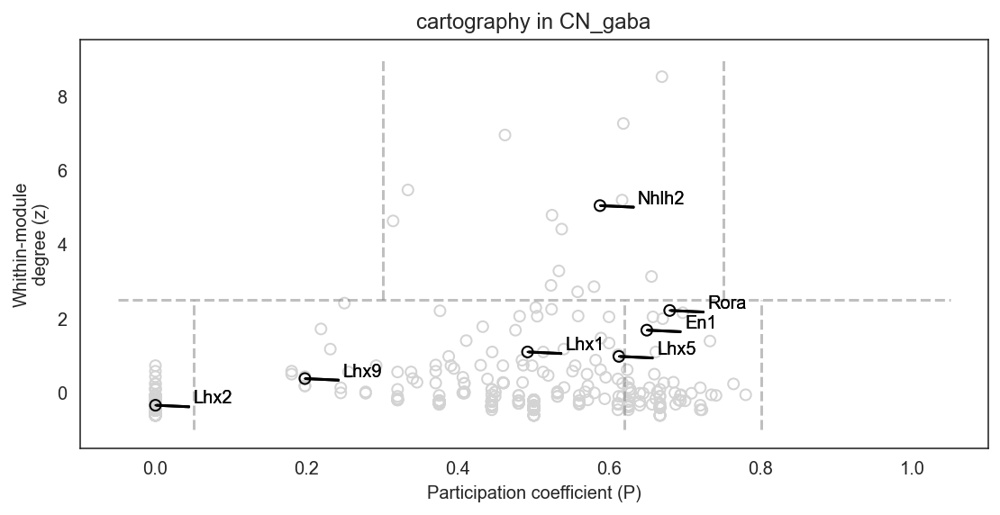

CN_late


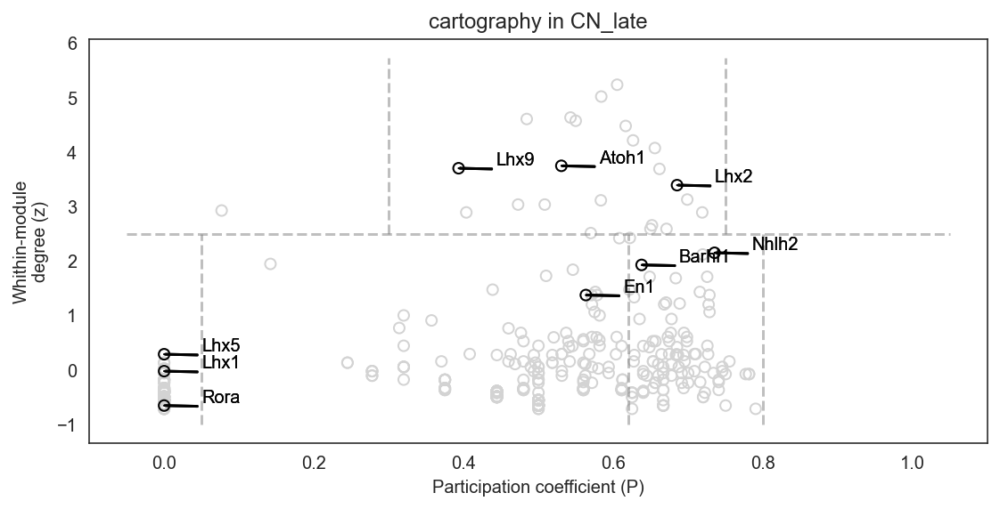

Endothelium


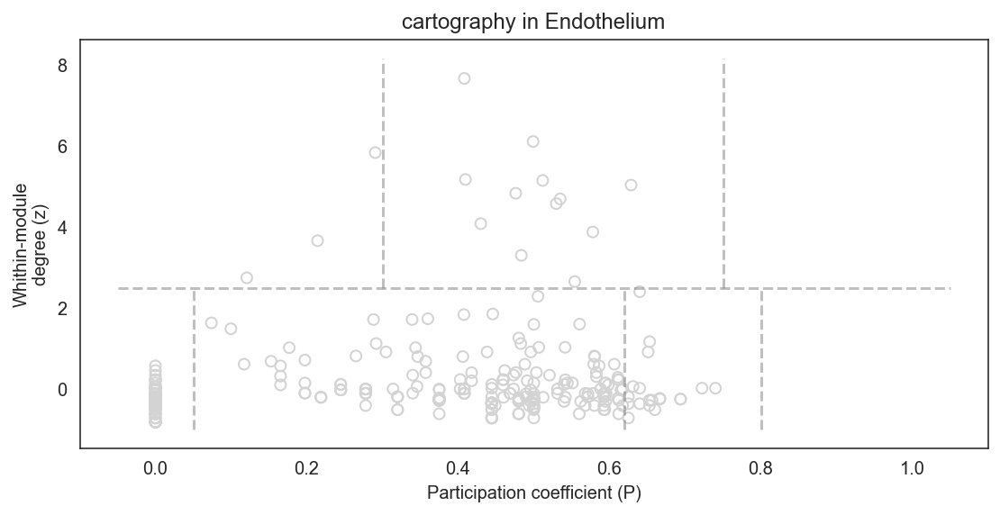

Eryth


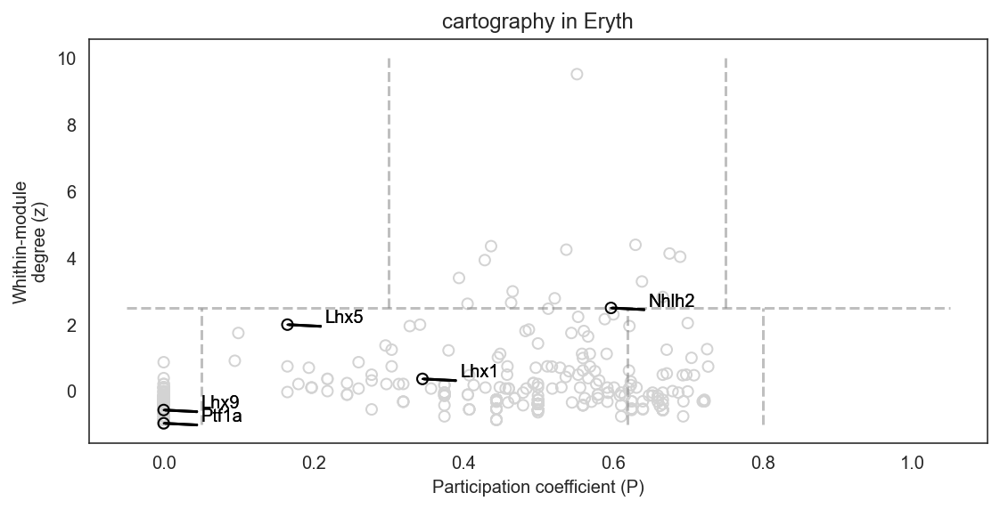

GABA_Pre


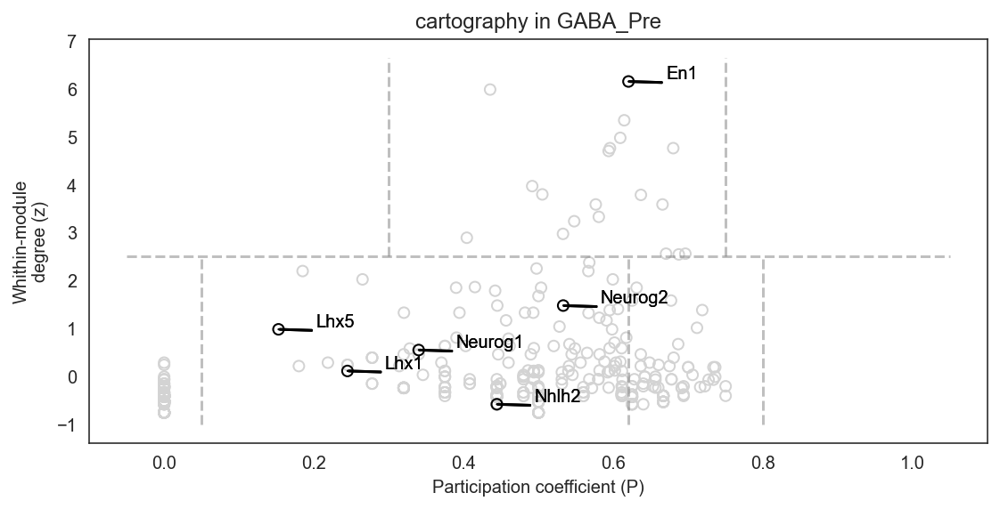

GABA_Pro


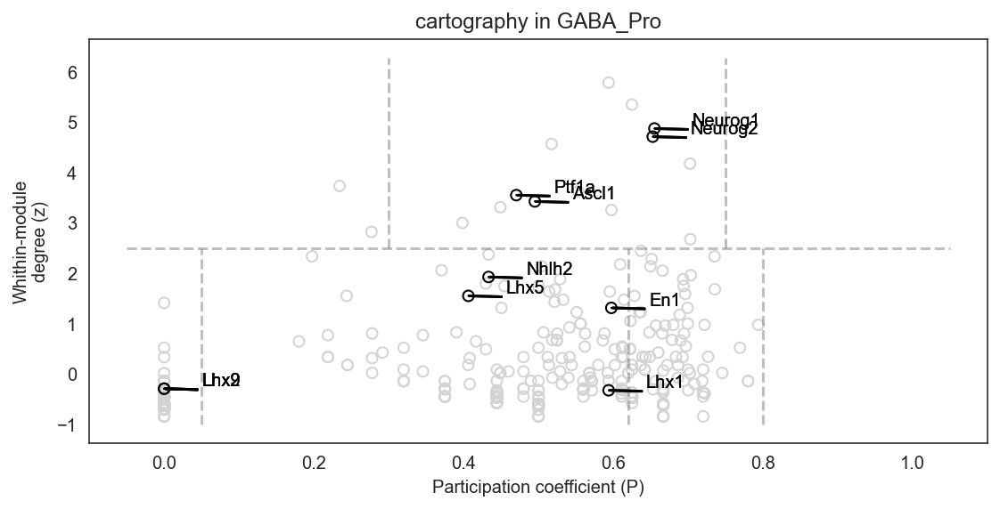

IN


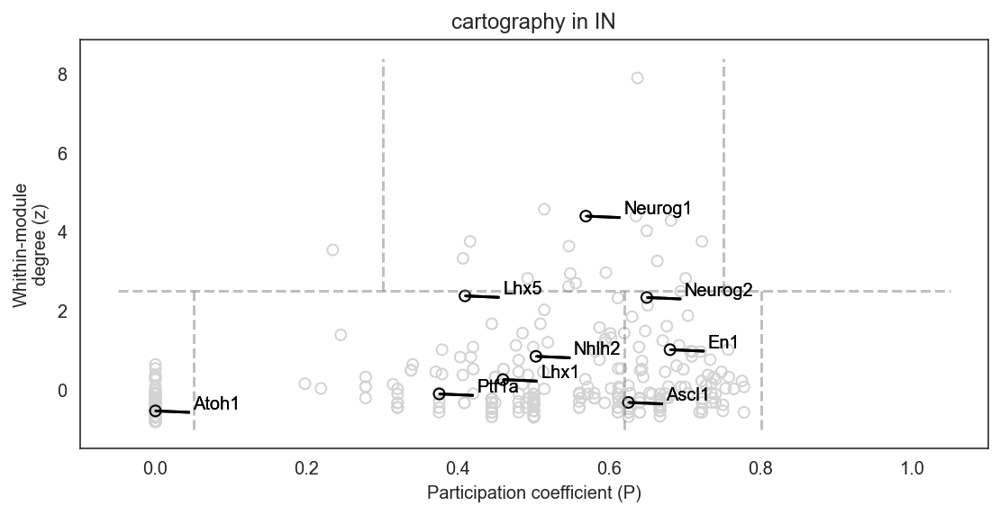

Leptomeningeal cell


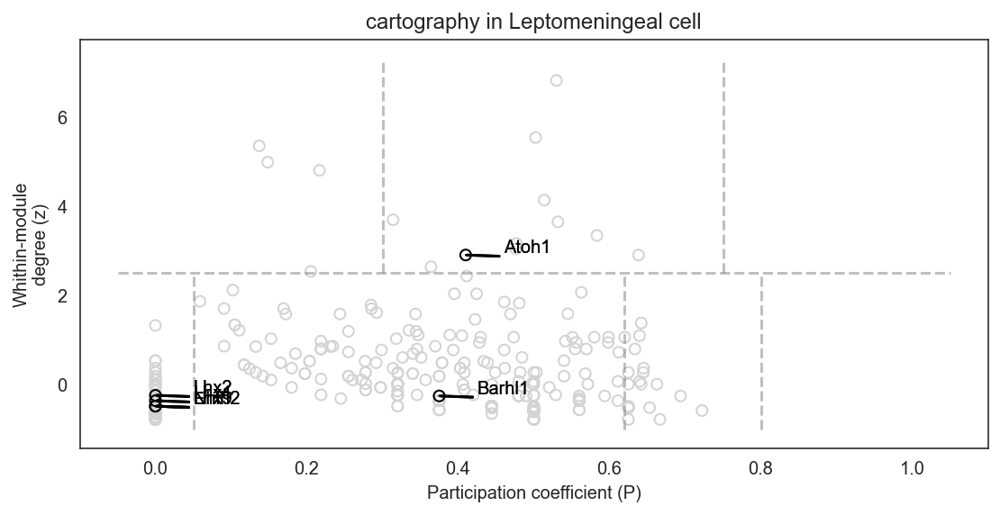

Mes.Isl1


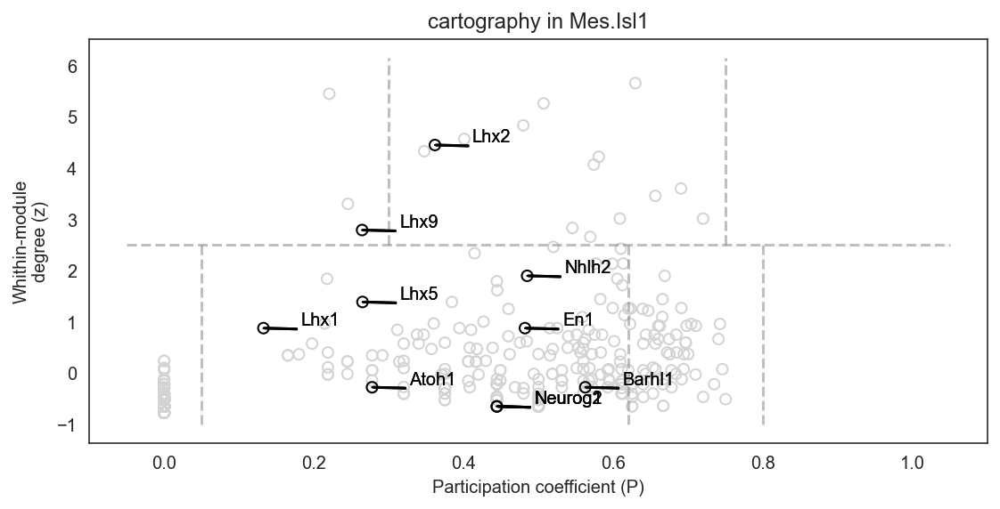

Microglia


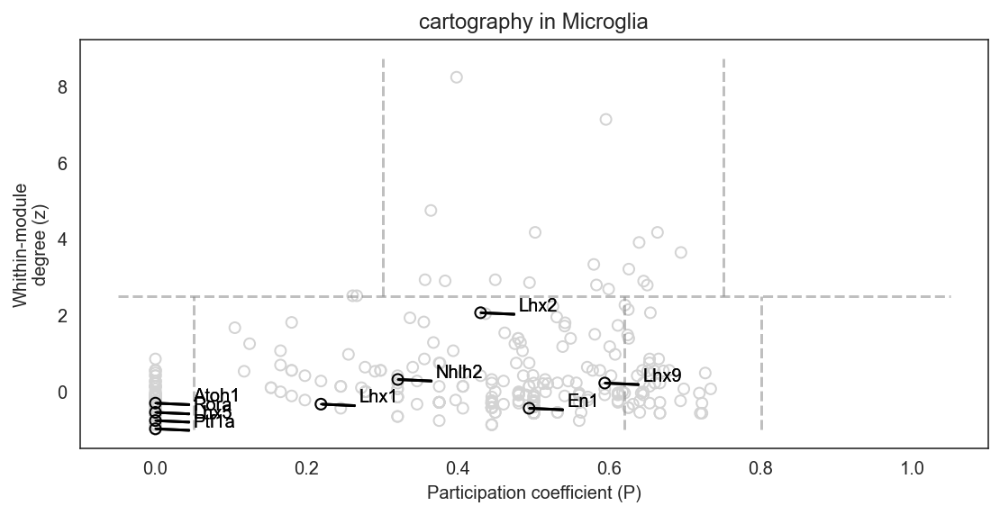

NPC


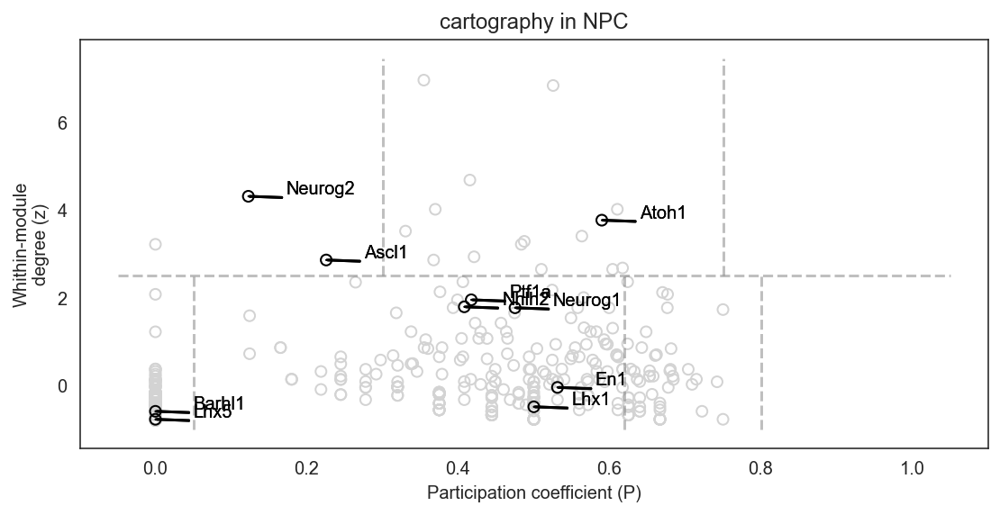

NPC_cyc


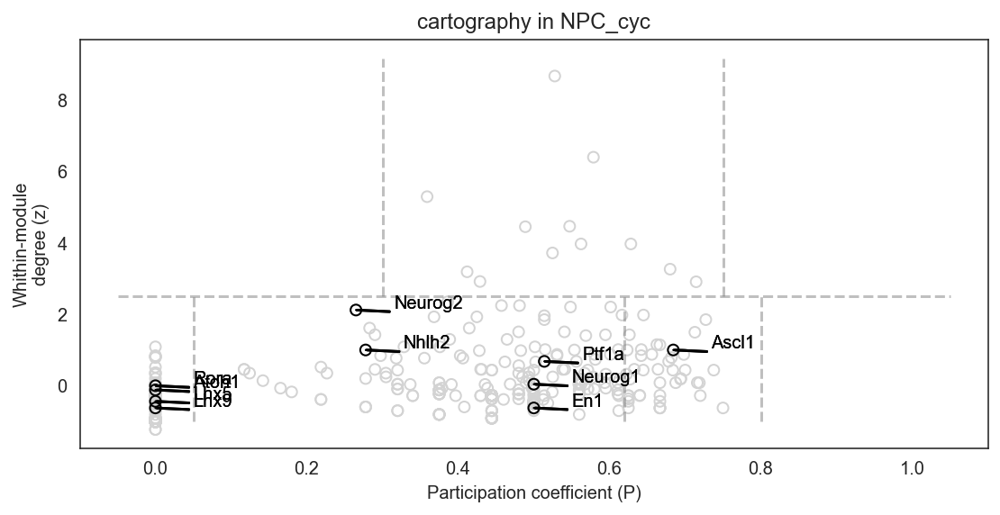

NPCa


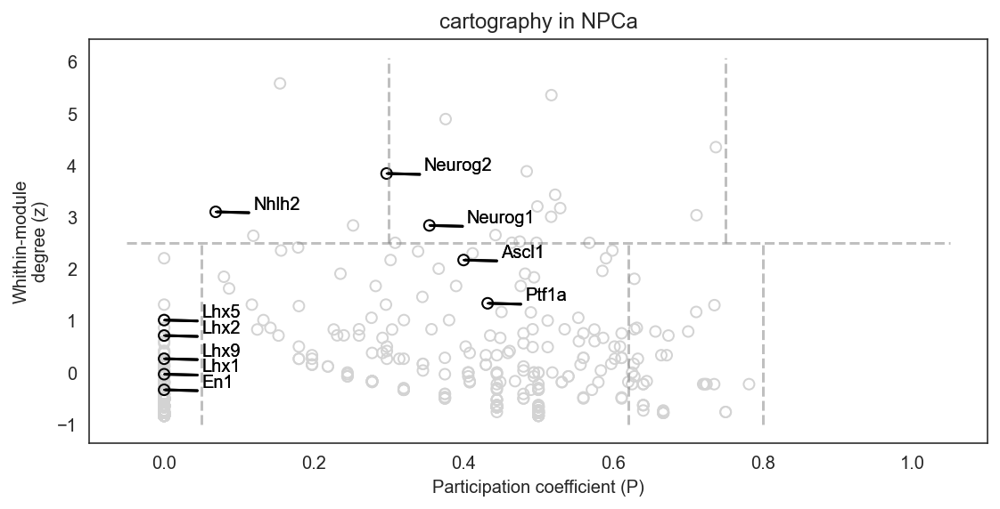

PC


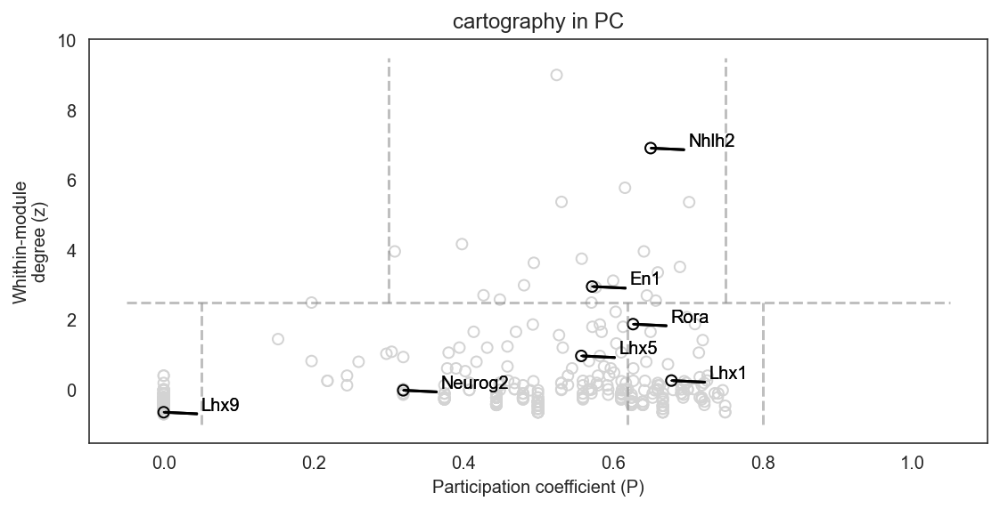

PTZ


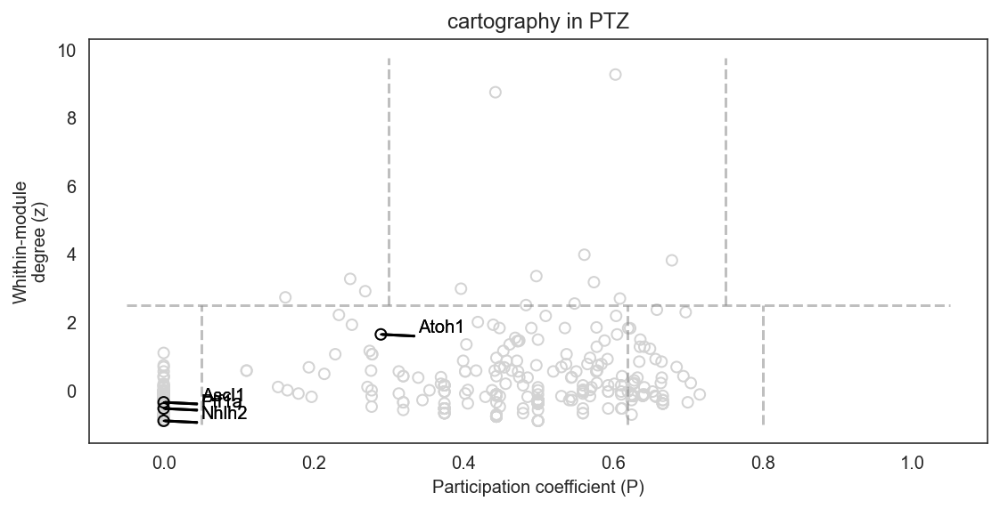

Pericytes


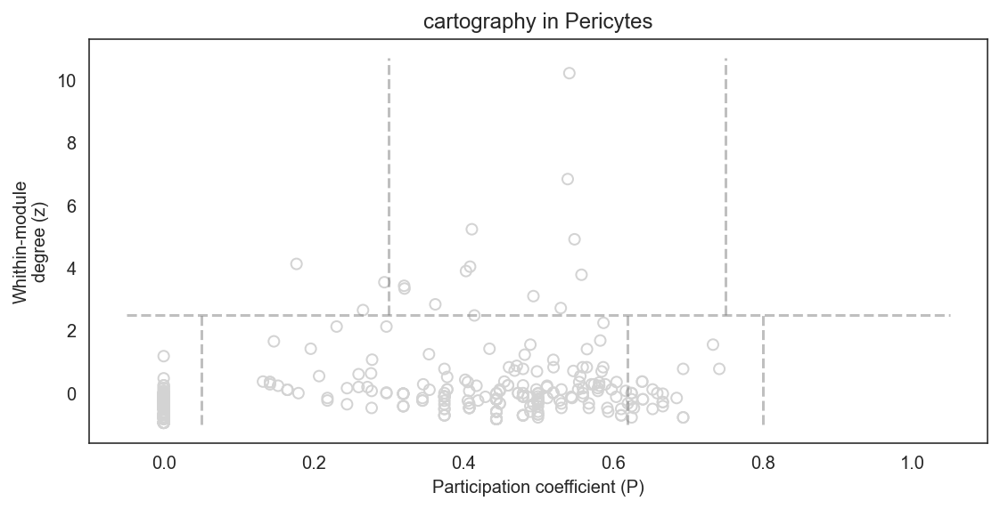

RL


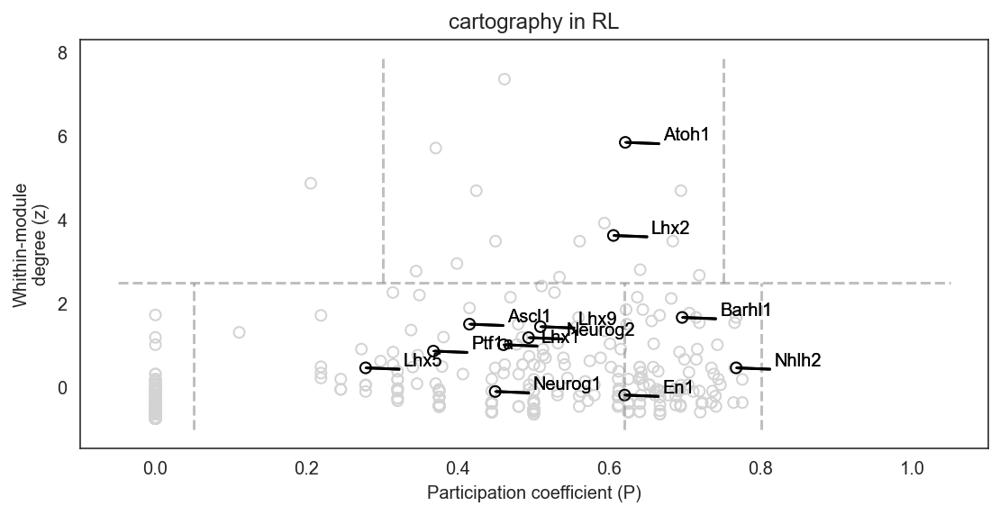

X_Otp


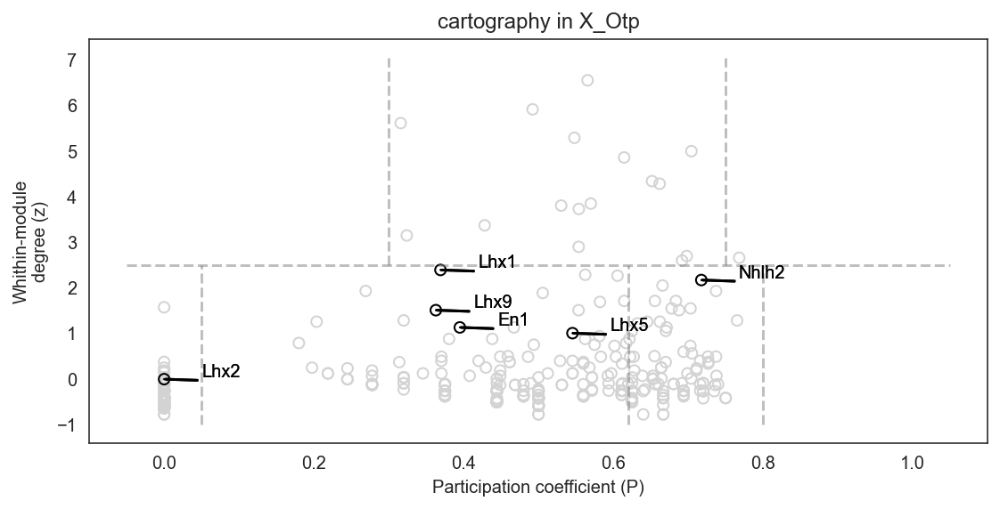

X_Otp_Pre


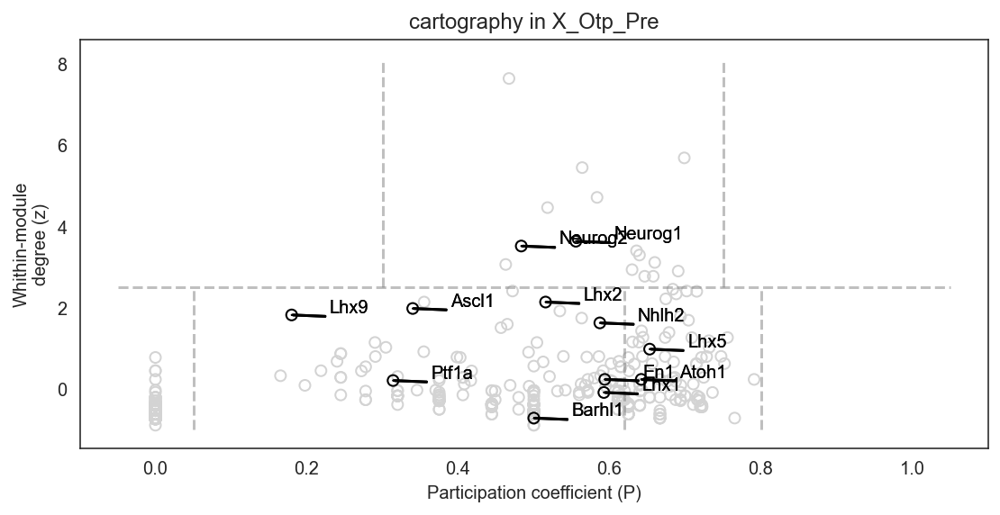

X_Tlx3


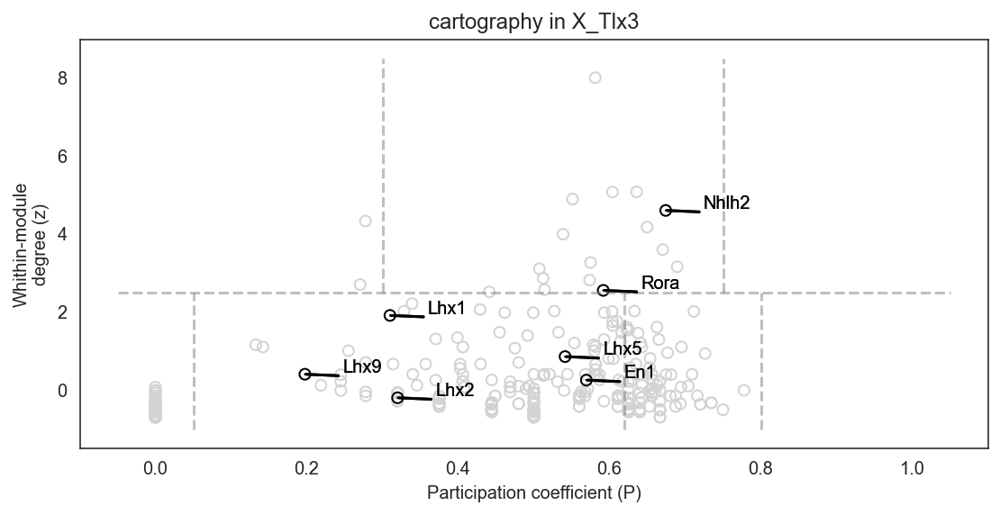

In [27]:
# Plot cartography as a scatter plot
plt.rcParams['figure.figsize'] = [10, 5]
#plt.figure(figsize=(10,8))
links.plot_cartography_scatter_per_cluster(scatter=True,
                                           kde=False,
                                           gois=["Atoh1", "Ascl1", "Ptf1a","Lhx1",'Lhx5','Rora','Nhlh2','Lhx2','Lhx9','Barhl1','En1','Neurog1','Neurog2'],
                                           auto_gene_annot=False,
                                           args_dot={"n_levels": 105},
                                           args_line={"c":"gray"}, save=f"{save_folder}/cartography_selected")

Atoh1


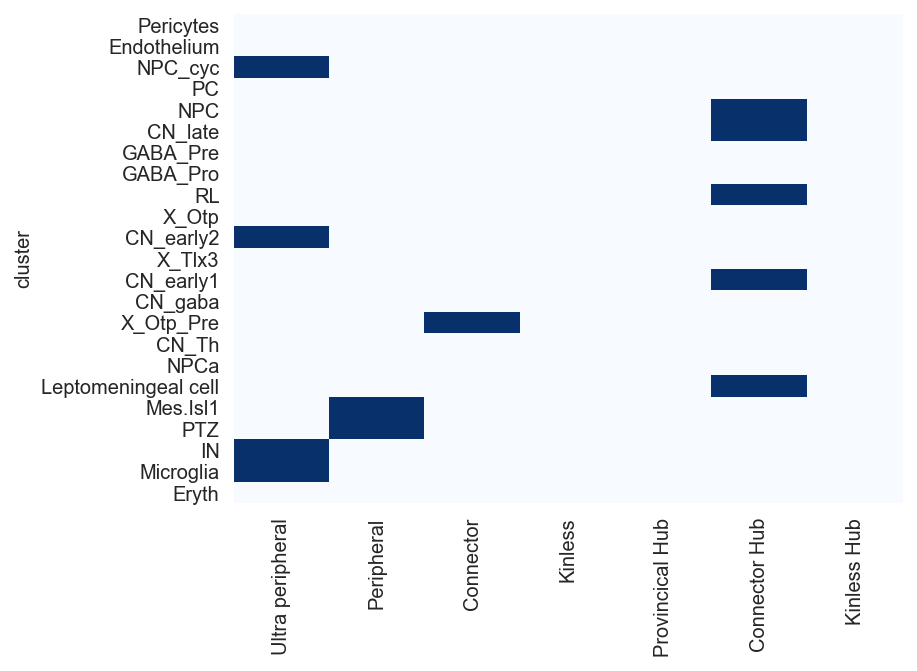

In [62]:
# Plot the summary of cartography analysis
links.plot_cartography_term(goi="Atoh1", save=f"{save_folder}/cartography")

# 8. Network analysis; network score distribution

Next, we visualize the distribution of network score to get insight into the global trend of the GRNs.

## 8.1. Distribution of network degree

degree_centrality_all


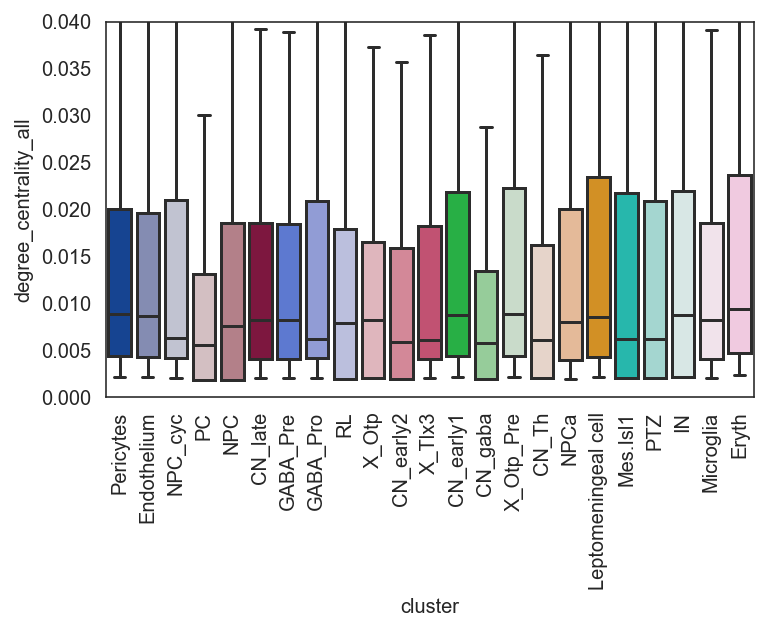

In [63]:
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0,0.040])
links.plot_score_discributions(values=["degree_centrality_all"], method="boxplot", save=f"{save_folder}")

eigenvector_centrality


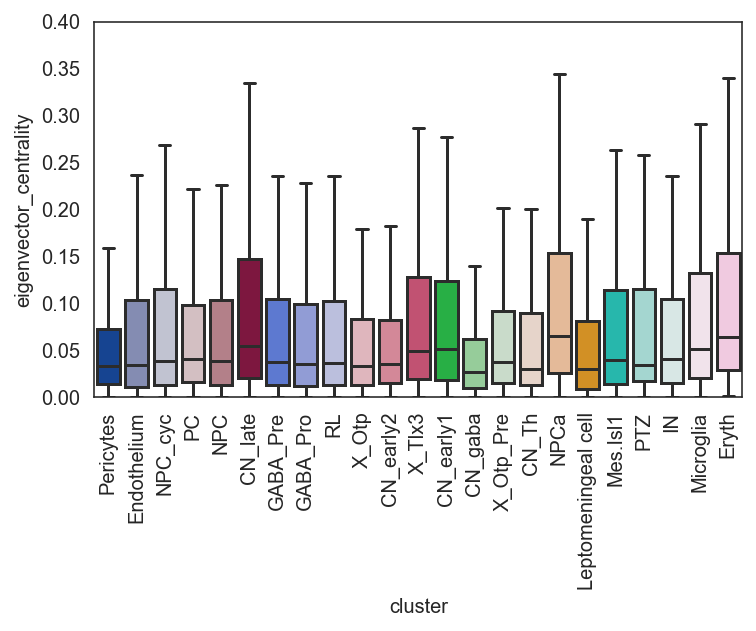

In [64]:
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0, 0.40])
links.plot_score_discributions(values=["eigenvector_centrality"], method="boxplot", save=f"{save_folder}")

## 8.2. Distribution of netowrk entropy

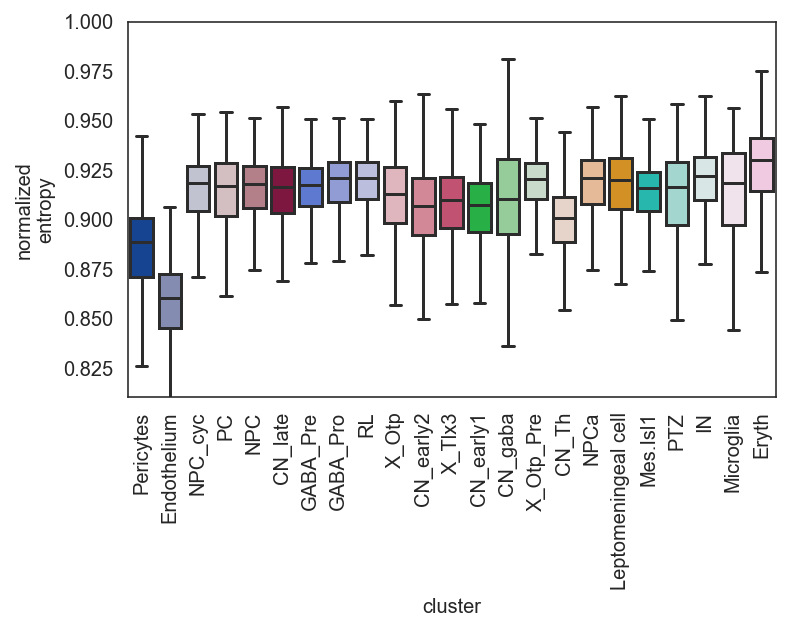

In [9]:
plt.subplots_adjust(left=0.15, bottom=0.3)
links.plot_network_entropy_distributions(save=f"{save_folder}")

Recreate the plot based on the order of median values across the network.

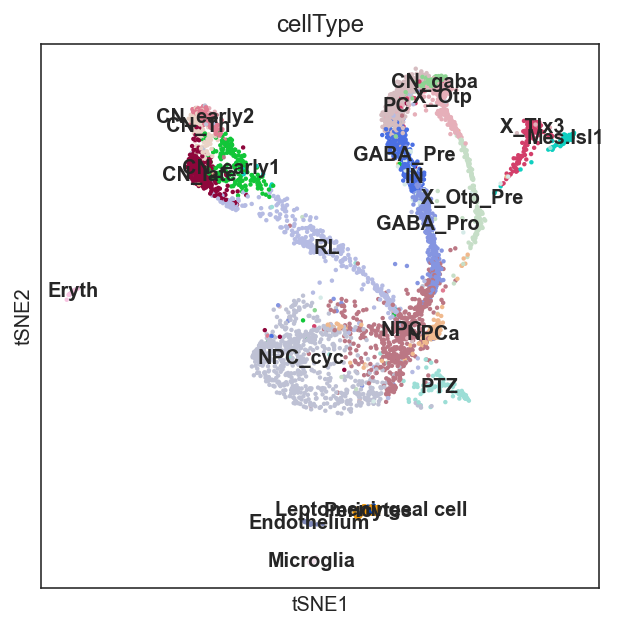

In [21]:
plt.rcParams['figure.figsize'] = [5, 5]
sc.pl.tsne(oracle.adata, color="cellType", legend_loc='on data', save="_UMAP")